In [2]:
import nbimporter
import load_data as ld
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sb
import numpy as np
import pandas as pd
from BCBio import GFF
from Bio.Seq import Seq
from Bio.SeqUtils import GC
from Bio.SeqRecord import SeqRecord
from Bio.SeqFeature import SeqFeature, FeatureLocation
import operator
import scipy as sc
from scipy.stats import spearmanr
import cProfile
from multiprocessing import Pool, Array
import functools
import statsmodels.stats.multitest as smm
from Bio import SeqIO
import subprocess
import shutil
from scipy.stats import nbinom
from scipy.special import binom, betainc
import math
from scipy.stats import logser
import os
from scipy.optimize import newton

In [14]:
import load_data as ld

In [12]:
from importlib import reload
reload(ld)

Importing Jupyter notebook from load_data.ipynb


<module 'load_data' from 'load_data.ipynb'>

In [8]:
binLength = 450
binStep = 150
dataPath = "../H3K27me3/H3K27me3_filtered_by_biosample.csv"
blackListPath = "../wgEncodeDacMapabilityConsensusExcludable.bed"
binValueBoundary = 5#если значение бина меньше этого - обнуляем(считаем, что это шум)

In [13]:
#Загружаем наши данные
ld.loadWholeGenome(dataPath, binLength, binStep, "../H3K27me3/WGBins.pickle", False)

KeyError: 'File accession'

In [41]:
#Считаем координаты бинов
ld.getBinsCoords(binLength, binStep)

Count coors for  chr13
Count coors for  chr12
Count coors for  chr11
Count coors for  chr10
Count coors for  chr17
Count coors for  chr16
Count coors for  chr15
Count coors for  chr14
Count coors for  chr19
Count coors for  chr18
Count coors for  chr22
Count coors for  chr20
Count coors for  chr21
Count coors for  chr7
Count coors for  chr6
Count coors for  chr5
Count coors for  chr4
Count coors for  chr3
Count coors for  chr2
Count coors for  chr1
Count coors for  chr9
Count coors for  chr8


In [4]:
#Загружаем контроль
ld.loadWholeGenome(dataPath, binLength, binStep, "../H3K27me3/WGControlBins.pickle", True)

Chrom chr13, length = 115169878
blackZones: 
[(56545728, 56545925), (110076444, 110076782)]
Download chr13, ENCFF000AHF, length = 115169878
(115169550, 115170000)
(115169700, 115170150)
(115169850, 115170300)
Download chr13, ENCFF000AGZ, length = 115169878
(115169550, 115170000)
(115169700, 115170150)
(115169850, 115170300)
Download chr13, ENCFF000CFK, length = 115169878
(115169550, 115170000)
(115169700, 115170150)
(115169850, 115170300)
Download chr13, ENCFF000BQP, length = 115169878
(115169550, 115170000)
(115169700, 115170150)
(115169850, 115170300)
Download chr13, ENCFF000CIP, length = 115169878
(115169550, 115170000)
(115169700, 115170150)
(115169850, 115170300)
Download chr13, ENCFF000CQH, length = 115169878
(115169550, 115170000)
(115169700, 115170150)
(115169850, 115170300)
Download chr13, ENCFF000ARD, length = 115169878
(115169550, 115170000)
(115169700, 115170150)
(115169850, 115170300)
Download chr13, ENCFF000AVH, length = 115169878
(115169550, 115170000)
(115169700, 115170

In [3]:
load_all_variables(['WGBins', 'WGControlBins'])

Loaded the following variables: ['WGBins', 'WGControlBins']


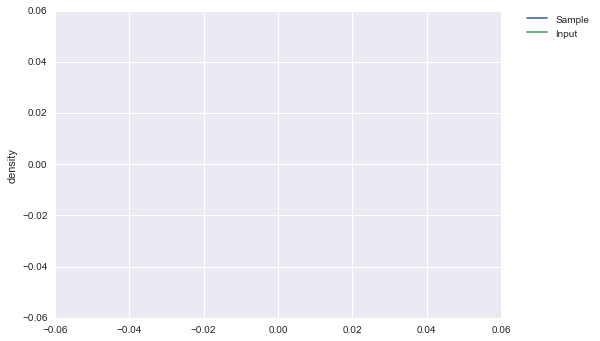

In [27]:
#График сравнение образца с инпутом(21 хромосома)
#113904
plt.plot(WGBins['chr14'][0][100000:123570], label="Sample")
plt.plot(WGControlBins['chr14'][0][100000:123570], label="Input")
plt.ylabel('density')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

In [36]:
#Нормализация к инпуту
WGnormSamplesSizes = {}#нормализованный "размер" образцов для всех хромосом
for name, length in ld.chroms.iteritems():
    i = 0
    normBins = WGBins[name].copy()
    normControlBins = WGControlBins[name].copy()
    normSamplesSizes = ld.getSamplesSizes(dataPath)
    for r1, r2 in zip(ld.getSamplesSizes(dataPath), ld.getControlSamplesSizes(controlDataPath)):
        n1 = (r1 + r2)/float(2*r1)
        n2 = (r1 + r2)/float(2*r2)
        normSamplesSizes[i] = n1*r1
        normBins[i, :] = map(lambda x: 0 if x is None else x*n1, normBins[i, :])
        normControlBins[i, :] = map(lambda x: 0 if x is None else x*n2, normControlBins[i, :])
        #Теперь вычитаем инпут из образцов
        normBins[i, :] = [a - b if a - b > 0 else 0 for a, b in zip(normBins[i, :], normControlBins[i, :])]
        i = i + 1
        
    WGnormSamplesSizes[name] = normSamplesSizes
    #перезаписываем
    WGBins[name] = normBins

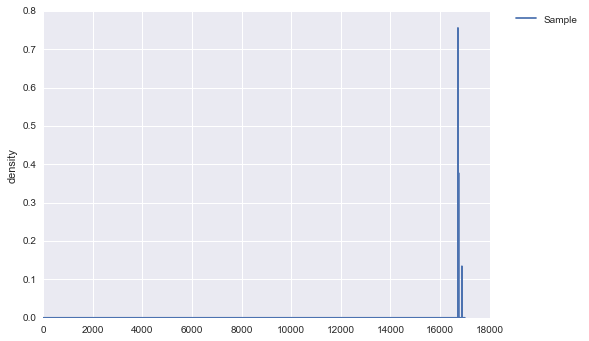

In [38]:
plt.plot(WGBins['chr14'][0][110000:127000], label="Sample")
plt.ylabel('density')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

In [39]:
#теперь нормализуем все образцы между собой + уберем "шум прибора"
for name, length in ld.chroms.iteritems():
    normToAllSamplesBins = WGBins[name].copy()
    normSamplesSizes = WGnormSamplesSizes[name]
    sumReads = np.sum(normSamplesSizes)
    for i in range(0, len(normSamplesSizes)):
        n = sumReads/float(len(normSamplesSizes) * normSamplesSizes[i])
        normToAllSamplesBins[i, :] = map(lambda x: x*n if x*n > binValueBoundary else 0, normToAllSamplesBins[i, :])
    #перезаписываем
    WGBins[name] = normToAllSamplesBins

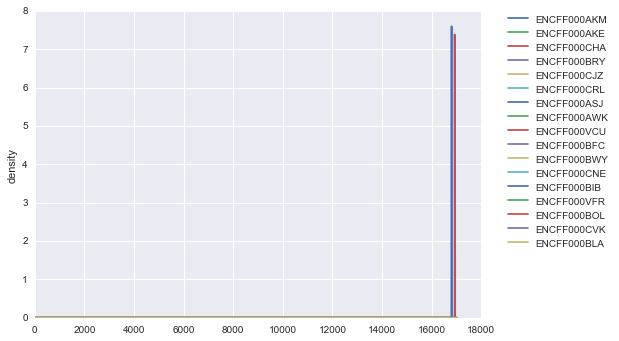

In [40]:
#график плотностей после нормализации и убирания шума прибора
bigWig = ld.filterEncodeData(p.read_table(dataPath))
for i in range(0,len(bigWig)):
    plt.plot(WGBins['chr14'][i][110000:127000], label=bigWig['File accession'].values[i])
plt.ylabel('density')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

In [75]:
#Сохранить нормализованные бины
#Впринципе после этого предыдущие данные не нужны(кроме координат)
save_variable('WGBinsCoords', WGBinsCoords)

In [4]:
load_all_variables(['WGnormToAllSamplesBins'])

Loaded the following variables: ['WGnormToAllSamplesBins']


In [42]:
load_all_variables(['WGBinsCoords'])

Loaded the following variables: ['WGBinsCoords']


In [45]:
#выкинуть бины у которых нет ни одного значения большего или равного binValueBoundary + попроавить WGBinsCoords
for name, length in ld.chroms.iteritems():
    goodBinsCoords = list(WGBinsCoords[name])
    goodBins = WGBins[name].copy()
    
    mask = map(lambda x: True if sorted([d for d in x], reverse=True)[0] >= binValueBoundary else False, 
        [c for c in np.rollaxis(WGBins[name], 1)])
    
    WGBinsCoords[name] = [i for i, j in zip(goodBinsCoords, mask) if j]
    WGBins[name] = np.rollaxis(np.array([i for i, j in zip(np.rollaxis(goodBins, 1), mask) if j], dtype=np.object), 1)

In [30]:
save_variable('WGgoodBinsBins', WGBins)

In [31]:
save_variable('WGgoodBinsCoords', WGBinsCoords)

In [576]:
load_all_variables(['WGgoodBinsBins', 'WGgoodBinsCoords', 'sortedOverBinStd'])

Loaded the following variables: ['WGgoodBinsBins', 'WGgoodBinsCoords']


In [49]:
#TODO: надо сохранить оригинальные значения без +1?
for name, length in ld.chroms.iteritems():
    WGBins[name] = WGBins[name] + 1

In [7]:
stds = {}
for name, length in ld.chroms.iteritems():
    mean = WGgoodBinsBins[name].mean(axis=0)
    allMean = np.mean(mean)
    
    normMeanBins = WGgoodBinsBins[name].copy()

    for i in range(0, len(mean)):
        normMeanBins[:, i] = map(lambda x:x*(allMean/mean[i]), normMeanBins[:, i])

    stds[name] = np.std(normMeanBins, axis=0, dtype=np.float64)

(array([  7.78850000e+04,   1.97370500e+06,   1.33200100e+06,
          6.23212000e+05,   3.00048000e+05,   1.37417000e+05,
          5.36340000e+04,   1.22150000e+04,   2.71700000e+03,
          4.53000000e+02]),
 array([  1.63061565,   4.63936915,   7.64812264,  10.65687614,
         13.66562963,  16.67438313,  19.68313662,  22.69189012,
         25.70064361,  28.70939711,  31.7181506 ]),
 <a list of 10 Patch objects>)

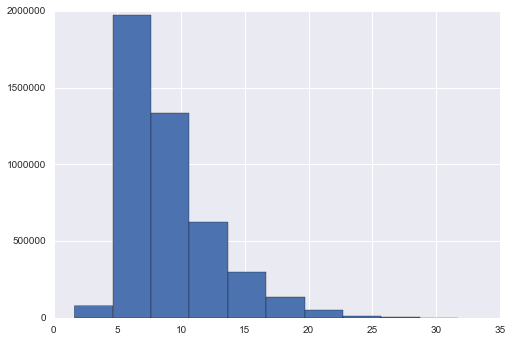

In [10]:
plt.hist([item for sublist in stds.values() for item in sublist])

In [2]:
load_all_variables(['sortedOverBinStd'])

Loaded the following variables: ['sortedOverBinStd']


In [3]:
sortedOverBinStd['chr21']

[(0, 6.7743549588286722),
 (1, 5.9016261278457245),
 (2, 5.8896673004060496),
 (3, 5.1477167788179647),
 (4, 5.3515180223487935),
 (5, 5.6656290862898757),
 (6, 5.2196647422315685),
 (7, 5.5733880007321561),
 (8, 5.4567240120461129),
 (9, 5.3255173359527097),
 (10, 6.2657132773636253),
 (11, 5.8351991410767008),
 (12, 6.4678189796893601),
 (13, 6.4704884554293294),
 (14, 6.6573584611767416),
 (15, 4.976788427144613),
 (16, 5.0462606820107636),
 (17, 5.1003316536272001),
 (18, 5.5736524792652871),
 (19, 5.3774633810126415),
 (20, 6.6504874799233944),
 (21, 5.0717930896355181),
 (22, 5.4173474795051781),
 (23, 5.0654489219804439),
 (24, 5.0087804385220354),
 (25, 5.5503534603557165),
 (26, 5.9124658012805966),
 (27, 5.4145348197133529),
 (28, 5.6372780393042499),
 (29, 5.4549316522275761),
 (30, 5.7235260667067029),
 (31, 5.9725944570594489),
 (32, 6.3171006921295385),
 (33, 6.703897848275437),
 (34, 6.7423943763687495),
 (35, 5.4904215852154525),
 (36, 5.325750420166802),
 (37, 5.304941

In [11]:
sortedOverBinStd = {}
for name, std in stds.iteritems():
    d = dict(enumerate(std))
    sortedOverBinStd[name] = sorted(d.items(), key=operator.itemgetter(0))

In [37]:
save_variable("sortedOverBinStd", sortedOverBinStd)

In [4]:
in_file = "gencode.v25lift37.annotation.gff3"
in_handle = open(in_file)

limit_info = dict(
    gff_id = ['chr1', 'chr10', 'chr11', 'chr12', 'chr13', 'chr14', 'chr15', 'chr16', 'chr17', 'chr18', 
 'chr19', 'chr2', 'chr20', 'chr21', 'chr22', 'chr3', 'chr4', 'chr5', 'chr6', 'chr7', 'chr8', 'chr9'],
    gff_type = ["gene"])

genes = []
for rec in GFF.parse(in_handle, limit_info=limit_info):
    genes.append((rec.id, rec.features)) 
    
in_handle.close()  

In [5]:
genesStartPositions = {
    g.id:[i, g.location.start.position, g.location.end.position, g.strand] for i, j in genes for g in j}

In [6]:
len(genesStartPositions)

86

In [14]:
def filterGenesByChrom(chrom):
    return {gene: positions for gene, positions in genesStartPositions.iteritems() if positions[0] == chrom}


In [17]:
np.sum([len(WGgoodBinsCoords[name]) for name, length in ld.chroms.iteritems()])

4513287

In [32]:
def calculatePromotors():
    binsGenes = []
    for name, length in ld.chroms.iteritems():
        i = 0#счетчик бинов
        print("Chrom " + name)
        for b in WGgoodBinsCoords[name]:
            startBinPosition = b[0]
            endBinPosition = b[1]

            #в дальнейшем мы будем выбирать бин с лучшей дисперсией(или захотим поменять функцию, поэтому делаем это здесь)
            binsColumnStd = sortedOverBinStd[name][i][1]

            hasGene = False
            genes = filterGenesByChrom(name)
            for gene, positions in genes.iteritems():
                if(positions[3] == 1):#+ цепь, значит TSS это start, значит делаем -1000/+1000 для получения зоны промотора
                    promotorStart = positions[1] - 1000
                    promotorEnd = positions[1] + 1000
                else:#- цепь, значит TSS это end, значит делаем +1000/-1000
                    promotorStart = positions[2] - 1000
                    promotorEnd = positions[2] + 1000

                #бин должен заходить в зону промотора как минимум на 150bp(почему?)
                if((endBinPosition - promotorStart >= binStep) & (promotorEnd - startBinPosition >= binStep)):
                    binsGenes.append([name, b, gene, binsColumnStd])
                    hasGene = True
                    #бин может быть сразу в нескольких промоторах? Думаем что нет
                    break;

            if(not hasGene):
                binsGenes.append([name, b, None, binsColumnStd])
            else:
                hasGene = False 

            i = i + 1

In [66]:
load_all_variables(['binsGenes_chr1', 'binsGenes_chr2','binsGenes_chr3', 'binsGenes_chr4', 'binsGenes_chr5', 
                    'binsGenes_chr6', 'binsGenes_chr7', 'binsGenes_chr8', 'binsGenes_chr9', 'binsGenes_chr10', 
                    'binsGenes_chr11', 'binsGenes_chr12', 'binsGenes_chr13', 'binsGenes_chr14', 'binsGenes_chr15',
                    'binsGenes_chr16', 'binsGenes_chr17', 'binsGenes_chr18', 'binsGenes_chr19', 'binsGenes_chr20', 
                    'binsGenes_chr21', 'binsGenes_chr22'])

Loaded the following variables: ['binsGenes_chr1', 'binsGenes_chr2', 'binsGenes_chr3', 'binsGenes_chr4', 'binsGenes_chr5', 'binsGenes_chr6', 'binsGenes_chr7', 'binsGenes_chr8', 'binsGenes_chr9', 'binsGenes_chr10', 'binsGenes_chr11', 'binsGenes_chr12', 'binsGenes_chr13', 'binsGenes_chr14', 'binsGenes_chr15', 'binsGenes_chr16', 'binsGenes_chr17', 'binsGenes_chr18', 'binsGenes_chr19', 'binsGenes_chr20', 'binsGenes_chr21', 'binsGenes_chr22']


In [67]:
binsGenes = binsGenes_chr1 + binsGenes_chr2 + binsGenes_chr3 + binsGenes_chr4 + binsGenes_chr5 + binsGenes_chr6 + binsGenes_chr7 + binsGenes_chr8 + binsGenes_chr9 + binsGenes_chr10 + binsGenes_chr11 + binsGenes_chr12 + binsGenes_chr13 + binsGenes_chr14 + binsGenes_chr15 + binsGenes_chr16 + binsGenes_chr17 + binsGenes_chr18 + binsGenes_chr19 + binsGenes_chr20 + binsGenes_chr21 + binsGenes_chr22

In [68]:
save_variable("binsGenes", binsGenes)

In [69]:
binsGenes[100]

['chr1', (29100, 29550), 'ENSG00000243485.4', 5.0012657708123793]

In [73]:
WGgoodBinsCoords['chr1'].index((29100, 29550))

100

In [75]:
len(binsGenes)

4513287

In [12]:
binsInPromotors = [g for g in binsGenes if g[2] is not None]

In [13]:
len(binsInPromotors)

352675

In [25]:
#У скольких генов в промотере есть бины?
b = set([g[2] for g in binsInPromotors])
print(str(len(list(b))) + u" из " + str(len(genesStartPositions)))

39217 из 57127


In [28]:
sortedOverBinStd

{'chr1': [(0, 6.2617010763072871),
  (1, 10.380994144247889),
  (2, 11.721057737907588),
  (3, 11.016568833226764),
  (4, 9.7669107559385662),
  (5, 7.3391072921344254),
  (6, 6.2176640955189937),
  (7, 9.4185065304564635),
  (8, 7.9472258685542325),
  (9, 7.2692083951764008),
  (10, 7.6412427173653752),
  (11, 7.8948102311540147),
  (12, 7.9617816211088686),
  (13, 7.8497875521550222),
  (14, 5.816812475415202),
  (15, 7.6846182868101502),
  (16, 10.130840105579834),
  (17, 9.4458072233634454),
  (18, 12.29901144657104),
  (19, 14.212926633811662),
  (20, 16.787241639799767),
  (21, 16.913289529013372),
  (22, 15.992560906222213),
  (23, 15.823002213417528),
  (24, 14.888149444498357),
  (25, 15.962307533949749),
  (26, 16.311930632222609),
  (27, 15.098051242301487),
  (28, 11.258928117055826),
  (29, 7.8961961932537692),
  (30, 8.0843239069437889),
  (31, 7.6275905716315284),
  (32, 6.6513877740836573),
  (33, 7.9044792059326188),
  (34, 7.9277960110749843),
  (35, 8.672801357538796

In [88]:
biggestStd

[['chr1', (19200, 19650), None, 19.585858235663427],
 ['chr1', (19350, 19800), None, 21.588243542968563],
 ['chr1', (19500, 19950), None, 22.029894471711291],
 ['chr1', (19650, 20100), None, 21.034160511001016],
 ['chr1', (19800, 20250), None, 22.90752419557656],
 ['chr1', (19950, 20400), None, 23.730088012758429],
 ['chr1', (20100, 20550), None, 23.966008924257906],
 ['chr1', (20250, 20700), None, 23.875310166281885],
 ['chr1', (20400, 20850), None, 22.227102896194289],
 ['chr1', (20550, 21000), None, 20.408644279215675],
 ['chr1', (20700, 21150), None, 17.262925152084041],
 ['chr1', (30000, 30450), 'ENSG00000243485.4', 17.658361701364257],
 ['chr1', (30150, 30600), 'ENSG00000243485.4', 17.841525559393496],
 ['chr1', (30300, 30750), 'ENSG00000243485.4', 20.663384785993447],
 ['chr1', (30450, 30900), None, 20.923251758393125],
 ['chr1', (30600, 31050), None, 20.119330298266018],
 ['chr1', (30750, 31200), None, 19.014398331571673],
 ['chr1', (30900, 31350), None, 19.777246065803265],
 [

In [76]:
biggestStd = [b for b in binsGenes if b[3] >= 17]#Даже если сюда попадут бины вне промотера, они все равно отрежутся set'ом

In [81]:
load_all_variables(['WGBinsCoords'])

Loaded the following variables: ['WGBinsCoords']


In [77]:
len(biggestStd)

185501

In [49]:
biggestStd

[['chr1', (19200, 19650), None, 19.585858235663427],
 ['chr1', (19350, 19800), None, 21.588243542968563],
 ['chr1', (19500, 19950), None, 22.029894471711291],
 ['chr1', (19650, 20100), None, 21.034160511001016],
 ['chr1', (19800, 20250), None, 22.90752419557656],
 ['chr1', (19950, 20400), None, 23.730088012758429],
 ['chr1', (20100, 20550), None, 23.966008924257906],
 ['chr1', (20250, 20700), None, 23.875310166281885],
 ['chr1', (20400, 20850), None, 22.227102896194289],
 ['chr1', (20550, 21000), None, 20.408644279215675],
 ['chr1', (20700, 21150), None, 17.262925152084041],
 ['chr1', (30000, 30450), 'ENSG00000243485.4', 17.658361701364257],
 ['chr1', (30150, 30600), 'ENSG00000243485.4', 17.841525559393496],
 ['chr1', (30300, 30750), 'ENSG00000243485.4', 20.663384785993447],
 ['chr1', (30450, 30900), None, 20.923251758393125],
 ['chr1', (30600, 31050), None, 20.119330298266018],
 ['chr1', (30750, 31200), None, 19.014398331571673],
 ['chr1', (30900, 31350), None, 19.777246065803265],
 [

In [83]:
WGgoodBinsBins['chr1'][:,WGBinsCoords['chr1'].index((19650, 20100))]

array([0, 0, 0, 0, 0, 17.817653198454309, 0, 0, 0, 0, 12.935076147166891,
       0, 0, 0, 0, 0, 0], dtype=object)

In [85]:
WGBinsCoords['chr1'].index((19200, 19650))

128

In [16]:
genesSet = set([b[2] for b in biggestStd])

In [17]:
len(genesSet)

3028

In [18]:
#теперь из них надо выбрать те, что есть в RNA-seq(да, они почему-то есть не все)
rna = p.read_table(ld.getRNAseq("A549"))#у всех образцов одинаковый набор, поэтому выбрали любой
rnaGeneSet = [x for x in rna["gene_id"] if x in genesSet]#гены, в промоторах которых есть бины с хорошей дисперсией

In [19]:
len(rnaGeneSet)

1536

In [20]:
load_all_variables(['WGgoodBinsBins', 'WGgoodBinsCoords'])

Loaded the following variables: ['WGgoodBinsBins', 'WGgoodBinsCoords']


In [21]:
#TODO: или брать бины с +1?
ChIPData = []#строки - гены, столбцы - образцы
#находим индекс бина чтобы по нему получить сразу по всем образцам сигнал
for gene in rnaGeneSet:
    bins = [x for x in binsInPromotors if x[2] == gene]
    #ищем бин с лучшим показателем(сейчас это дисперсия)
    index, value = max(enumerate([b[-1] for b in bins]), key=operator.itemgetter(1))
    #Теперь по координатам бинов надо найти density(по всем образцам) и записать в ChIPData
    columnIndex = WGgoodBinsCoords[bins[index][0]].index(bins[index][1])
    ChIPData.append(WGgoodBinsBins[bins[index][0]][:, columnIndex].tolist())

In [22]:
ChIPData = np.reshape(np.array(ChIPData), (1536, 17))

In [23]:
#Фильтровать RNA?
#Теперь по названию гена найдем значения RNAseq для всех образцов(в этом нам поможет список bio samples)
RNAData = []
#Сначала получется строки - образцы, столбцы - гены, т.е.
for bs in ld.getBioSamples(p.read_table(dataPath)):
    rna = p.read_table(ld.getRNAseq(bs))
    RNAData.append(rna[[True if x in rnaGeneSet else False for x in rna["gene_id"]]]['TPM'].tolist())

In [24]:
RNAData = np.reshape(np.array(RNAData), (17, 1536)).T

In [39]:
corr = [spearmanr(x, y) for x, y in zip(ChIPData, RNAData) if (np.sum(x) > 0) & (np.sum(y) > 0)]

In [42]:
pv = [c for c in corr if c.pvalue < 0.05]

In [43]:
len(pv)

392

In [44]:
len(corr)

920

In [57]:
b = smm.multipletests([c.pvalue for c in corr], method='fdr_i')[0]

In [60]:
[corr[i].correlation for i in xrange(len(corr)) if b[i]]#21

[1.0,
 1.0,
 0.99804496391695707,
 0.72886898685566248,
 0.72886898685566248,
 1.0,
 0.72886898685566248,
 0.72886898685566248,
 1.0,
 -0.77161434682580243,
 0.72886898685566248,
 0.72886898685566248,
 1.0,
 1.0,
 1.0,
 0.89368482496441748,
 1.0,
 0.72886898685566248,
 1.0,
 1.0,
 0.84210526315789458,
 -0.84981691773317081]

In [ ]:
rej, pval_corr = smm.multipletests(pval_raw, method='fdr_i')[:2]

(array([  46.,   33.,   58.,   13.,   83.,    9.,   23.,    0.,    0.,  127.]),
 array([ 0.49648856,  0.5468397 ,  0.59719085,  0.64754199,  0.69789314,
         0.74824428,  0.79859542,  0.84894657,  0.89929771,  0.94964886,  1.        ]),
 <a list of 10 Patch objects>)

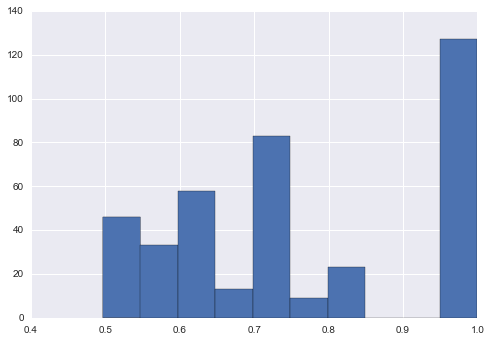

In [45]:
#TODO: Возможно столбик в нуле, это те гены, экспрессия которых не зависит от модификации, возможо мы можем взять
#известные гены, для которых нужна/не нужна метка и посмотреть на их экспресиию
plt.hist([c.correlation for c in pv])

In [47]:
import random

#А теперь сделаем отрицательный контроль: корреляция с бинами не из промотеров и посмотрим на график
#Просто возьмем бины, которые не относятся к этому гену
BackgroundChIPData = []#строки - гены, столбцы - образцы, т.е. shape = (413, 17)
for gene in rnaGeneSet:
    bins = [x for x in binsInPromotors if x[2] != gene]
    #Теперь по координатам бинов надо найти density(по всем образцам) и записать в ChIPData
    #ищем рандомный бин(среди тех, что точно не относятся к этому гену)
    index = random.randint(0,len(bins)-1)
    columnIndex = WGgoodBinsCoords[bins[index][0]].index(bins[index][1])
    BackgroundChIPData.append(WGgoodBinsBins[bins[index][0]][:, columnIndex].tolist())

In [48]:
BackgroundChIPData = np.reshape(np.array(BackgroundChIPData), (1536, 17))

In [49]:
corr = [spearmanr(x, y) for x, y in zip(BackgroundChIPData, RNAData) if (np.sum(x) > 0) & (np.sum(y) > 0)]

(array([  2.,   8.,   0.,   0.,   0.,   0.,   0.,  46.,  15.,  13.]),
 array([-0.84981692, -0.66483523, -0.47985353, -0.29487184, -0.10989015,
         0.07509154,  0.26007323,  0.44505492,  0.63003662,  0.81501831,  1.        ]),
 <a list of 10 Patch objects>)

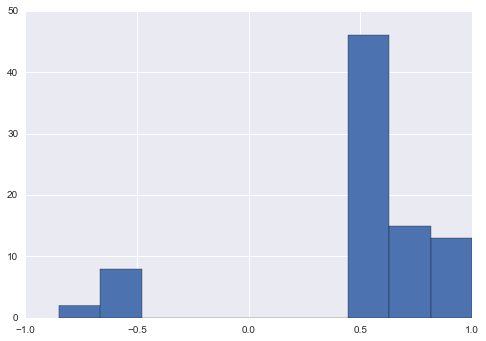

In [53]:
plt.hist([c.correlation for c in corr if c.pvalue < 0.05])

In [27]:
load_all_variables(['WGgoodBinsBins', 'WGbinsWithBigStd'])

Loaded the following variables: ['WGgoodBinsBins', 'WGbinsWithBigStd']


In [4]:
in_file = "gencode.v25lift37.long_noncoding_RNAs.gff3"
in_handle = open(in_file)

limit_info = dict(
    gff_id = ['chr1', 'chr10', 'chr11', 'chr12', 'chr13', 'chr14', 'chr15', 'chr16', 'chr17', 'chr18', 
 'chr19', 'chr2', 'chr20', 'chr21', 'chr22', 'chr3', 'chr4', 'chr5', 'chr6', 'chr7', 'chr8', 'chr9'],
    gff_type = ["gene"])

lncRNAgenes = []
for rec in GFF.parse(in_handle, limit_info=limit_info):
    lncRNAgenes.append((rec.id, rec.features)) 
    
in_handle.close()

In [5]:
lncRNAgenesStartPositions = {
    g.id:[i, g.location.start.position, g.location.end.position, g.strand] for i, j in lncRNAgenes for g in j}

In [6]:
#TODO: четверть всех генов - lncRNA?
len(lncRNAgenesStartPositions)

15488

In [13]:
rna = pd.read_table(ld.getRNAseq("A549"))#у всех образцов одинаковый набор, поэтому выбрали любой
lncRnaGeneSet = [x for x in rna["gene_id"] if x in lncRNAgenesStartPositions.keys()]

AttributeError: 'module' object has no attribute 'getRNAseq'

In [14]:
ld.chroms

AttributeError: 'module' object has no attribute 'chroms'

In [349]:
len(lncRnaGeneSet)

10504

In [350]:
lncRNAData = []
#TODO: считаем что во всхе RNA файлах одинаковый набор генов и они идут в одинаковом порядке
for bs in ld.getBioSamples(p.read_table(dataPath)):
    rna = p.read_table(ld.getRNAseq(bs))
    lncRNAData.append(rna[[True if x in lncRnaGeneSet else False for x in rna["gene_id"]]]['TPM'].tolist())

In [351]:
lncRNAData = np.reshape(np.array(lncRNAData), (17, 10504)).T

In [352]:
np.array(lncRNAData).shape

(10504, 17)

In [355]:
#теперь надо отфильтровать гены по порогу
mask = map(lambda x: True if sorted([d for d in x], reverse=True)[0] != 0 else False, 
        [e for e in lncRNAData])

In [356]:
len([b for b in mask if b])

6394

In [358]:
filteredLncRnaGeneSet = [i for i, j in zip(lncRnaGeneSet, mask) if j]

In [359]:
len(filteredLncRnaGeneSet)

6394

In [390]:
filteredLncRNAData = np.array([i for i, j in zip(lncRNAData, mask) if j])

In [391]:
filteredLncRNAData[0, :]

array([  3.44,   3.44,  13.3 ,   2.26,   1.38,   0.56,  22.97,  19.47,
        30.72,   6.69,  13.72,   2.46,   1.01,   2.54,   1.09,   0.74,
         1.68])

In [375]:
filteredLncRNAData[0, :]

array([ 3.44,  0.  ,  0.  ,  3.21,  0.  ,  0.  ,  0.02,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.05,  0.14,  0.01])

In [361]:
len(filteredLncRnaGeneSet)

6394

In [369]:
filteredLncRNAData = np.reshape(np.array(filteredLncRNAData), (17, 6394)).T

In [370]:
filteredLncRNAData.shape

(6394, 17)

In [366]:
filteredLncRnaGeneSet.index('ENSG00000254873.1')

3162

In [392]:
filteredLncRNAData[3162, :]

array([  1.00000000e-02,   1.00000000e-02,   0.00000000e+00,
         1.00000000e-02,   1.00000000e-02,   0.00000000e+00,
         1.13200000e+01,   9.00000000e-02,   0.00000000e+00,
         2.00000000e-02,   7.00000000e-02,   0.00000000e+00,
         0.00000000e+00,   2.00000000e-02,   8.00000000e-02,
         0.00000000e+00,   8.00000000e-02])

In [393]:
mask10 = map(lambda x: True if sorted([d for d in x], reverse=True)[0] >= 10 else False, 
        [e for e in lncRNAData])

In [395]:
len([b for b in mask10 if b])

150

In [396]:
filteredLncRnaGeneSet10 = [i for i, j in zip(lncRnaGeneSet, mask10) if j]

In [399]:
filteredLncRNAData10 = np.array([i for i, j in zip(lncRNAData, mask10) if j])

In [400]:
filteredLncRNAData10.shape

(150, 17)

In [437]:
save_variable('filteredLncRNAData10', filteredLncRNAData10)
save_variable('filteredLncRnaGeneSet10', filteredLncRnaGeneSet10)

In [27]:
WGgoodBinsBins['chr21'].T.shape

(63811, 17)

In [79]:
save_variable('WGbinsWithBigStd', biggestStd)

In [126]:
#хотим получить все бины с корреляцией выше 17 и сами значения этих бинов
WGbinsWithBigStd = [[k, b[0], WGgoodBinsBins[k][:, b[0]]] for k, l in sortedOverBinStd.iteritems() for b in l if b[1]>=17]

In [28]:
WGbinsWithBigStd[0]

['chr13',
 831,
 array([0, 0, 0, 144.29094838135182, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=object)]

In [154]:
save_variable("filteredLncRnaGeneSet", filteredLncRnaGeneSet)

In [60]:
#~2 минуты на ген, 10500 генов
a = map(lambda x: (x[0], x[1], spearmanr(lncRNAData[2,:], x[2]).correlation), WGbinsWithBigStd)

In [62]:
[i for i in a if i[2]>=0.8]

[('chr19', 11189, 0.8045042030423849),
 ('chr19', 11190, 0.8045042030423849),
 ('chr12', 4301, 0.84157180284126609),
 ('chr14', 10643, 0.81067450224983362),
 ('chr19', 11189, 0.8045042030423849),
 ('chr19', 11190, 0.8045042030423849)]

In [29]:
def calcCorrelation(rna):
    def calc(b):
        return (b[0], b[1], spearmanr(rna, b[2]))
    print(rna)
    return map(calc, WGbinsWithBigStd)

In [4]:
load_all_variables(['binsGenes'])

Loaded the following variables: ['binsGenes']


In [15]:
binsGenes

[['chr1', (9600, 10050), None, 6.2617010763072871],
 ['chr1', (9750, 10200), None, 10.380994144247889],
 ['chr1', (9900, 10350), None, 11.721057737907588],
 ['chr1', (10050, 10500), None, 11.016568833226764],
 ['chr1', (10200, 10650), None, 9.7669107559385662],
 ['chr1', (10350, 10800), None, 7.3391072921344254],
 ['chr1', (10500, 10950), None, 6.2176640955189937],
 ['chr1', (10800, 11250), 'ENSG00000223972.5', 9.4185065304564635],
 ['chr1', (10950, 11400), 'ENSG00000223972.5', 7.9472258685542325],
 ['chr1', (11100, 11550), 'ENSG00000223972.5', 7.2692083951764008],
 ['chr1', (11250, 11700), 'ENSG00000223972.5', 7.6412427173653752],
 ['chr1', (11400, 11850), 'ENSG00000223972.5', 7.8948102311540147],
 ['chr1', (11550, 12000), 'ENSG00000223972.5', 7.9617816211088686],
 ['chr1', (11700, 12150), 'ENSG00000223972.5', 7.8497875521550222],
 ['chr1', (12600, 13050), 'ENSG00000223972.5', 5.816812475415202],
 ['chr1', (12750, 13200), None, 7.6846182868101502],
 ['chr1', (12900, 13350), None, 10.1

In [21]:
a = np.array([b[3] for b in binsGenes])
p = np.percentile(a, 25)
print p

6.37089938788


In [25]:
len([b for b in binsGenes if b[3] >=17])

185501

In [27]:
import random
q25 = [b for b in binsGenes if b[3] <= p]
q25Random = random.sample(q25, 185501)

In [29]:
q25Random

[['chr2', (176033100, 176033550), 'ENSG00000229750.1', 3.3473496039754616],
 ['chr4', (103915800, 103916250), None, 6.2282822682751027],
 ['chr9', (111513300, 111513750), None, 5.8406286550049797],
 ['chr15', (46315200, 46315650), None, 5.7107252860847701],
 ['chr6', (34177200, 34177650), None, 5.884814801957404],
 ['chr5', (42575550, 42576000), None, 5.4363334063409487],
 ['chr4', (88158000, 88158450), None, 6.3077606456364261],
 ['chr3', (143935500, 143935950), None, 5.8706089343940278],
 ['chr2', (216694500, 216694950), None, 6.2937517341442586],
 ['chr3', (196041450, 196041900), None, 5.0193826253804836],
 ['chr8', (13209900, 13210350), 'ENSG00000253257.1', 6.2393131880807404],
 ['chr9', (93016500, 93016950), None, 5.9529476546306954],
 ['chr1', (165591600, 165592050), None, 6.3556048465773509],
 ['chr12', (120639600, 120640050), 'ENSG00000255857.5', 6.0390192781267142],
 ['chr7', (72610500, 72610950), None, 5.4819794776265898],
 ['chr15', (100066650, 100067100), None, 5.8732815786

In [438]:
load_all_variables(['corrs10'])

Loaded the following variables: ['corrs10']


In [448]:
corrs10[0]

{'ENSG00000005206.12': [('chr17',
   18254,
   0.72494432540264264,
   0.000993112346100116),
  ('chr17', 77685, 0.73557395007852888, 0.00076465485738623528),
  ('chr17', 77686, 0.72632085839471361, 0.00096068767774196086),
  ('chr17', 194876, 0.74098978677485283, 0.00066618482094862983),
  ('chr14', 113904, 0.73482992983995143, 0.00077907807877563131),
  ('chr19', 6174, 0.72957823975059932, 0.00088742965046407184),
  ('chr19', 25028, 0.70675514570209264, 0.0015136190650587552),
  ('chr19', 83690, 0.74142033279815722, 0.00065883104106099512),
  ('chr19', 83691, 0.74142033279815722, 0.00065883104106099512),
  ('chr19', 102804, 0.71320807761180705, 0.0013080672809894489),
  ('chr19', 102805, 0.70903745510694327, 0.0014380850457761101),
  ('chr1', 355788, 0.7120805343134109, 0.0013422225481106074)]}

In [586]:
sum([len(v) for c in corrs10 for k, v in c.iteritems()])

954647

In [594]:
sum([len(v) for k, v in sortedOverBinStd.iteritems()])

4513287

In [441]:
bins = [(pvalue[0], pvalue[1]) for c in corrs10 for k, v in c.iteritems() for pvalue in v]

In [442]:
#посчитаем сколько корреляций у каждого бина с разными генами(мин - 1, макс - 28)
#TODO: возможно так много пережило, потомучто есть прям кучки бинов, которые наверное надо бы объединить
from collections import Counter
z = dict(Counter(bins))

In [444]:
max(z.values())

28

In [484]:
q = {k: len(v) for c in corrs10 for k, v in c.iteritems()}
sorted_x = sorted(q.items(), key=operator.itemgetter(1), reverse=True)

In [488]:
sorted_x = sorted(q.items(), key=operator.itemgetter(1), reverse=True)

In [489]:
sorted_x

[('ENSG00000245385.2', 36596),
 ('ENSG00000267633.1', 36596),
 ('ENSG00000265168.1', 36596),
 ('ENSG00000235576.1', 36596),
 ('ENSG00000265784.1', 36596),
 ('ENSG00000256007.1', 36596),
 ('ENSG00000236199.1', 36596),
 ('ENSG00000224645.1', 36596),
 ('ENSG00000256039.1', 36596),
 ('ENSG00000248996.1', 36596),
 ('ENSG00000250155.1', 31666),
 ('ENSG00000232698.1', 31666),
 ('ENSG00000262831.1', 31666),
 ('ENSG00000269243.1', 31666),
 ('ENSG00000258757.1', 30733),
 ('ENSG00000264019.1', 30733),
 ('ENSG00000255114.1', 30305),
 ('ENSG00000263986.1', 30042),
 ('ENSG00000254452.1', 30042),
 ('ENSG00000264558.1', 30042),
 ('ENSG00000226779.1', 28003),
 ('ENSG00000250501.2', 17728),
 ('ENSG00000227748.1', 17728),
 ('ENSG00000265843.2', 17728),
 ('ENSG00000234722.3', 17728),
 ('ENSG00000229205.2', 17728),
 ('ENSG00000237643.1', 17728),
 ('ENSG00000266976.1', 16945),
 ('ENSG00000261448.1', 16945),
 ('ENSG00000235335.2', 15563),
 ('ENSG00000264451.1', 15484),
 ('ENSG00000223808.1', 10050),
 ('ENSG0

In [449]:
pv = [pvalue[3] for c in corrs10 for k, v in c.iteritems() for pvalue in v]

In [450]:
len(pv)

954647

In [451]:
b = smm.multipletests(pv, method='fdr_i')[0]

In [453]:
len([i for i in b if i])

954647

In [503]:
good = [{k:pv} for c in corrs10 for k, v in c.iteritems() for pv in v if (k == 'ENSG00000245385.2')]

In [504]:
set([k for c in good for k, v in c.iteritems()])

{'ENSG00000245385.2'}

In [505]:
good

[{'ENSG00000245385.2': ('chr13', 5504, 1.0, 0.0)},
 {'ENSG00000245385.2': ('chr13', 5547, 1.0, 0.0)},
 {'ENSG00000245385.2': ('chr13', 5548, 1.0, 0.0)},
 {'ENSG00000245385.2': ('chr13', 5549, 1.0, 0.0)},
 {'ENSG00000245385.2': ('chr13',
   7610,
   0.72886898685566248,
   0.00090297353114025933)},
 {'ENSG00000245385.2': ('chr13',
   7611,
   0.72886898685566248,
   0.00090297353114025933)},
 {'ENSG00000245385.2': ('chr13', 7612, 1.0, 0.0)},
 {'ENSG00000245385.2': ('chr13', 7616, 1.0, 0.0)},
 {'ENSG00000245385.2': ('chr13',
   7617,
   0.72886898685566248,
   0.00090297353114025933)},
 {'ENSG00000245385.2': ('chr13',
   7618,
   0.72886898685566248,
   0.00090297353114025933)},
 {'ENSG00000245385.2': ('chr13', 7619, 1.0, 0.0)},
 {'ENSG00000245385.2': ('chr13', 8672, 1.0, 0.0)},
 {'ENSG00000245385.2': ('chr13', 14238, 1.0, 0.0)},
 {'ENSG00000245385.2': ('chr13', 26949, 1.0, 0.0)},
 {'ENSG00000245385.2': ('chr13',
   26954,
   0.72886898685566248,
   0.00090297353114025933)},
 {'ENSG00000

In [513]:
[b for b in WGbinsWithBigStd if (b[0] == 'chr13') and (b[1] == 7617)]

[['chr13',
  7617,
  array([0, 0, 0, 0, 0, 0, 172.2363736917338, 0, 0, 5.0377863258199218, 0, 0,
         0, 0, 0, 0, 0], dtype=object)]]

In [507]:
filteredLncRnaGeneSet10.index('ENSG00000245385.2')

57

In [65]:
load_all_variables(['filteredLncRnaGeneSet10'])

Loaded the following variables: ['filteredLncRnaGeneSet10']


In [509]:
filteredLncRNAData10[57, :]

array([  0.  ,   0.  ,   0.  ,   0.  ,   0.  ,   0.  ,  11.67,   0.  ,
         0.  ,   0.  ,   0.  ,   0.  ,   0.  ,   0.  ,   0.  ,   0.  ,   0.  ])

In [480]:
ld.getBioSamples(p.read_table(dataPath))

['A549',
 'A549',
 'astrocyte',
 'endothelial cell of umbilical vein',
 'fibroblast of dermis',
 'fibroblast of lung',
 'GM12878',
 'H1-hESC',
 'HCT116',
 'HepG2',
 'K562',
 'keratinocyte',
 'mammary epithelial cell',
 'MCF-7',
 'myotube',
 'osteoblast',
 'skeletal muscle myoblast']

In [ ]:
#надо попроовать выкинуть те бины, которые находятся в промоторах генов lncRNA - чтобы оставить те, что нас интересуют
#хотя по идее он же может регулировать сам себя через метку?

In [17]:
b = smm.multipletests(pv, method='fdr_i')[0]

In [19]:
len([i for i in xrange(len(b)) if b[i]])

4195800

In [9]:
a = [{k: cor(v)} for c in corrs for k, v in c.iteritems()]

In [8]:
def cor(corrs):
    return [(c[0], c[1], c[2].correlation, c[2].pvalue) for c in corrs if c[2].correlation >= 0.7] 

In [11]:
save_variable('a', a)

In [3]:
corrs[0]

NameError: name 'corrs' is not defined

In [32]:
s.correlation

0.41797891793597219

In [597]:
sortedGenesWithBinsCount

[('ENSG00000245385.2', 36596),
 ('ENSG00000267633.1', 36596),
 ('ENSG00000265168.1', 36596),
 ('ENSG00000235576.1', 36596),
 ('ENSG00000265784.1', 36596),
 ('ENSG00000256007.1', 36596),
 ('ENSG00000236199.1', 36596),
 ('ENSG00000224645.1', 36596),
 ('ENSG00000256039.1', 36596),
 ('ENSG00000248996.1', 36596),
 ('ENSG00000250155.1', 31666),
 ('ENSG00000232698.1', 31666),
 ('ENSG00000262831.1', 31666),
 ('ENSG00000269243.1', 31666),
 ('ENSG00000258757.1', 30733),
 ('ENSG00000264019.1', 30733),
 ('ENSG00000255114.1', 30305),
 ('ENSG00000263986.1', 30042),
 ('ENSG00000254452.1', 30042),
 ('ENSG00000264558.1', 30042),
 ('ENSG00000226779.1', 28003),
 ('ENSG00000250501.2', 17728),
 ('ENSG00000227748.1', 17728),
 ('ENSG00000265843.2', 17728),
 ('ENSG00000234722.3', 17728),
 ('ENSG00000229205.2', 17728),
 ('ENSG00000237643.1', 17728),
 ('ENSG00000266976.1', 16945),
 ('ENSG00000261448.1', 16945),
 ('ENSG00000235335.2', 15563),
 ('ENSG00000264451.1', 15484),
 ('ENSG00000223808.1', 10050),
 ('ENSG0

In [600]:
import csv
test = []
csv.register_dialect(
    'mydialect',
    delimiter = ';',
    quotechar = '"',
    doublequote = True,
    skipinitialspace = True,
    lineterminator = '\r\n',
    quoting = csv.QUOTE_MINIMAL)

header = ["lncRNA", "binsCount"]
             
with open('sortedGenesWithMergedBinsCount.csv', 'w') as mycsvfile:
    thedatawriter = csv.writer(mycsvfile, dialect='mydialect')
    thedatawriter.writerow(header)
    for row in sortedGenesWithMergedBinsCount:
        thedatawriter.writerow(row)

In [69]:
load_all_variables(['corrs10'])

Loaded the following variables: ['corrs10']


In [565]:
{k: v for c in corrs10 for k, v in c.iteritems() if k == 'ENSG00000271347.1'}

{'ENSG00000271347.1': []}

In [70]:
genesWithBinsCount = {k: len(v) for c in corrs10 for k, v in c.iteritems()}
sortedGenesWithBinsCount = sorted(genesWithBinsCount.items(), key=operator.itemgetter(1), reverse=True)

In [71]:
sortedGenesWithBinsCount

[('ENSG00000245385.2', 36596),
 ('ENSG00000267633.1', 36596),
 ('ENSG00000265168.1', 36596),
 ('ENSG00000235576.1', 36596),
 ('ENSG00000265784.1', 36596),
 ('ENSG00000256007.1', 36596),
 ('ENSG00000236199.1', 36596),
 ('ENSG00000224645.1', 36596),
 ('ENSG00000256039.1', 36596),
 ('ENSG00000248996.1', 36596),
 ('ENSG00000250155.1', 31666),
 ('ENSG00000232698.1', 31666),
 ('ENSG00000262831.1', 31666),
 ('ENSG00000269243.1', 31666),
 ('ENSG00000258757.1', 30733),
 ('ENSG00000264019.1', 30733),
 ('ENSG00000255114.1', 30305),
 ('ENSG00000263986.1', 30042),
 ('ENSG00000254452.1', 30042),
 ('ENSG00000264558.1', 30042),
 ('ENSG00000226779.1', 28003),
 ('ENSG00000250501.2', 17728),
 ('ENSG00000227748.1', 17728),
 ('ENSG00000265843.2', 17728),
 ('ENSG00000234722.3', 17728),
 ('ENSG00000229205.2', 17728),
 ('ENSG00000237643.1', 17728),
 ('ENSG00000266976.1', 16945),
 ('ENSG00000261448.1', 16945),
 ('ENSG00000235335.2', 15563),
 ('ENSG00000264451.1', 15484),
 ('ENSG00000223808.1', 10050),
 ('ENSG0

In [72]:
sum([i[1] for i in sortedGenesWithBinsCount])

954647

In [574]:
{k: v for c in corrs10 for k, v in c.iteritems() if k == 'ENSG00000229874.2'}

{'ENSG00000229874.2': [('chr20',
   49707,
   0.73321126186869912,
   0.00081123623082020259),
  ('chr6', 71510, 0.74540604377088127, 0.00059389451927509209),
  ('chr6', 71511, 0.79635850061823676, 0.00013068642654152153)]}

In [74]:
#Сливаем бины: пока идут подряд, в качестве значения корреляции берем наибольшую
mergedBins = {k: mergeBins(v) for c in corrs10 for k, v in c.iteritems()}

In [558]:
mergedBins

{'ENSG00000005206.12': [('chr17', (18254, 18254), 1, 0.72494432540264264),
  ('chr17', (77685, 77686), 2, 0.73557395007852888),
  ('chr17', (194876, 194876), 1, 0.74098978677485283),
  ('chr14', (113904, 113904), 1, 0.73482992983995143),
  ('chr19', (6174, 6174), 1, 0.72957823975059932),
  ('chr19', (25028, 25028), 1, 0.70675514570209264),
  ('chr19', (83690, 83691), 2, 0.74142033279815722),
  ('chr19', (102804, 102805), 2, 0.71320807761180705)],
 'ENSG00000170161.6': [('chr12', (98095, 98095), 1, 0.72374087375294427),
  ('chr12', (147170, 147171), 2, 0.73363254856505744),
  ('chr12', (165278, 165278), 1, 0.75374417881003808),
  ('chr11', (46186, 46188), 3, 0.71384919894083121),
  ('chr11', (105787, 105787), 1, 0.77798417465530301),
  ('chr11', (159259, 159260), 2, 0.73363254856505744),
  ('chr10', (33724, 33724), 1, 0.73857838597111403),
  ('chr17', (17122, 17124), 3, 0.78571141410594292),
  ('chr17', (42764, 42766), 3, 0.73687737873418124),
  ('chr17', (71872, 71872), 1, 0.7148015068

In [575]:
save_variable('mergedBins', mergedBins)

In [75]:
genesWithMergedBinsCount = {k: len(v) for k, v in mergedBins.iteritems()}
sortedGenesWithMergedBinsCount = sorted(genesWithMergedBinsCount.items(), key=operator.itemgetter(1), reverse=True)

In [78]:
#TODO: одинаковое количество бинов, не странно ли это? Как будто одинаковые РНК
len(sortedGenesWithMergedBinsCount)

150

In [77]:
sum([i[1] for i in sortedGenesWithMergedBinsCount])

245939

In [19]:
def mergeBins(binss):
    tmpBins = []
    bins = []
    for b in binss:
        if len(tmpBins) > 0:
            if (b[1] - tmpBins[-1][1] == 1) and (b[0] == tmpBins[-1][0]):
                tmpBins.append(b)
            else:
                bins.append((tmpBins[-1][0], (tmpBins[0][1], tmpBins[-1][1]), len(tmpBins), max(tmpBins, key=lambda b: b[2])[2]))
                tmpBins[:] = []
                tmpBins.append(b)
        else:
            tmpBins.append(b)
    if(len(tmpBins) > 0):
        bins.append((tmpBins[-1][0], (tmpBins[0][1], tmpBins[-1][1]), len(tmpBins), max(tmpBins, key=lambda b: b[2])[2]))
    return bins

In [192]:
from pyensembl import EnsemblRelease

data = EnsemblRelease(75)

In [193]:
data.download() 
data.index()

KeyboardInterrupt: 

In [22]:
data.genes_by_name('TFAP2A')

[Gene(gene_id=ENSG00000137203, gene_name=TFAP2A, biotype=protein_coding, location=6:10393419-10419892)]

In [24]:
 data.gene_by_id('ENSG00000265168').gene_name

u'RP11-192H23.5'

In [14]:
mono_TF = p.read_table('HUMAN_mono_motifs.tsv')['Transcription factor'].tolist()

In [32]:
di_TF = p.read_table('HUMAN_di_motifs.tsv')['Transcription factor'].tolist()

In [188]:
TF = pd.read_table('TF.csv', delimiter=";")['P-values'].tolist()

In [189]:
TF = set([t.split("_")[0] for t in TF])

In [190]:
len(TF)

599

In [191]:
#TFGeneSet = map(lambda x: [i.gene_id for i in data.genes_by_name(x)], TF)
TFGeneSet = []
TFGeneSetError = []
for t in TF:
    try:
        TFGeneSet = TFGeneSet + [i.gene_id for i in data.genes_by_name(t)] 
    except ValueError:
        TFGeneSetError.append(t)

AttributeError: 'DataFrame' object has no attribute 'genes_by_name'

In [49]:
TFGeneSetError

[]

In [51]:
len(TFGeneSet)

635

In [52]:
rna = p.read_table(ld.getRNAseq("A549"))#у всех образцов одинаковый набор, поэтому выбрали любой
TFGeneSet = [x for x in rna["gene_id"] if x.split(".")[0] in TFGeneSet]

In [53]:
len(TFGeneSet)

600

In [56]:
TFData = []
#TODO: считаем что во всхе RNA файлах одинаковый набор генов и они идут в одинаковом порядке
for bs in ld.getBioSamples(p.read_table(dataPath)):
    rna = p.read_table(ld.getRNAseq(bs))
    TFData.append(rna[[True if x in TFGeneSet else False for x in rna["gene_id"]]]['TPM'].tolist())

In [57]:
len(TFData[0])

600

In [58]:
TFData = np.reshape(np.array(TFData), (17, 600)).T

mask = map(lambda x: True if sorted([d for d in x], reverse=True)[0] >= 10 else False, 
        [e for e in TFData])

filteredTFGeneSet = [i for i, j in zip(TFGeneSet, mask) if j]
filteredTFData = np.array([i for i, j in zip(TFData, mask) if j])

In [62]:
save_variable('filteredTFGeneSet', filteredTFGeneSet)
save_variable('filteredTFData', filteredTFData)

In [5]:
epifactors = p.read_table('genes.tsv')['HGNC approved symbol'].tolist()

In [13]:
len(epifactors)

142

In [14]:
epifactorsGeneSet = map(lambda x: [i.gene_id for i in data.genes_by_name(x)], epifactors)

In [16]:
epifactorsGeneSet = [item for sublist in epifactorsGeneSet for item in sublist]

In [18]:
rna = p.read_table(ld.getRNAseq("A549"))#у всех образцов одинаковый набор, поэтому выбрали любой
epifactorsGeneSet = [x for x in rna["gene_id"] if x.split(".")[0] in epifactorsGeneSet]

In [19]:
len(epifactorsGeneSet)

144

In [24]:
epifactorsData = []
#TODO: считаем что во всхе RNA файлах одинаковый набор генов и они идут в одинаковом порядке
for bs in ld.getBioSamples(p.read_table(dataPath)):
    rna = p.read_table(ld.getRNAseq(bs))
    epifactorsData.append(rna[[True if x in epifactorsGeneSet else False for x in rna["gene_id"]]]['TPM'].tolist())

In [27]:
epifactorsData = np.reshape(np.array(epifactorsData), (17, 144)).T

mask = map(lambda x: True if sorted([d for d in x], reverse=True)[0] >= 10 else False, 
        [e for e in epifactorsData])

filteredEpifactorsGeneSet = [i for i, j in zip(epifactorsGeneSet, mask) if j]
filteredEpifactorsData = np.array([i for i, j in zip(epifactorsData, mask) if j])

In [61]:
len(filteredEpifactorsGeneSet)

112

In [29]:
save_variable('filteredEpifactorsGeneSet', filteredEpifactorsGeneSet)
save_variable('filteredEpifactorsData', filteredEpifactorsData)

In [106]:
os.chdir('/Users/e.mazurov/workspace/Epigenetics')

In [107]:
load_all_variables(['TFcorrs'])

Loaded the following variables: ['TFcorrs']


In [69]:
TFcorrs

[{'ENSG00000001167.10': [('chr12',
    19309,
    0.81928343501708856,
    5.7300972421689162e-05),
   ('chr12', 68798, 0.73153472836084854, 0.00084569465768068316),
   ('chr11', 103825, 0.77193430479718672, 0.00028305884856625214),
   ('chr11', 104831, 0.75011902439425548, 0.00052405519067191375),
   ('chr11', 104832, 0.7683774996330609, 0.00031434228898713187),
   ('chr11', 105786, 0.72075888497824581, 0.0010973034772174535),
   ('chr17', 4780, 0.71938601091162058, 0.0011333816038250958),
   ('chr17', 57101, 0.77142057883952841, 0.00028740949937308262),
   ('chr17', 77685, 0.71432993707987102, 0.0012747978287274424),
   ('chr17', 77686, 0.70560582500021196, 0.0015528733095637748),
   ('chr17', 114509, 0.7807174777006769, 0.00021675793688644848),
   ('chr17', 114510, 0.74897715075117366, 0.0005403146664515533),
   ('chr17', 114511, 0.77480394905293837, 0.000259755232148983),
   ('chr17', 114512, 0.7120805343134109, 0.0013422225481106074),
   ('chr17', 114513, 0.7120805343134109, 0.001

In [70]:
TFgenesWithBinsCount = {k: len(v) for c in TFcorrs for k, v in c.iteritems()}
sortedTFGenesWithBinsCount = sorted(TFgenesWithBinsCount.items(), key=operator.itemgetter(1), reverse=True)

In [71]:
sortedTFGenesWithBinsCount

[('ENSG00000102145.9', 15563),
 ('ENSG00000122180.4', 7374),
 ('ENSG00000165702.8', 5095),
 ('ENSG00000135100.13', 4911),
 ('ENSG00000012504.9', 4075),
 ('ENSG00000185811.12', 2643),
 ('ENSG00000124092.8', 2463),
 ('ENSG00000108753.8', 2283),
 ('ENSG00000196092.8', 1881),
 ('ENSG00000164458.5', 1468),
 ('ENSG00000171956.5', 1465),
 ('ENSG00000101076.12', 898),
 ('ENSG00000124664.6', 674),
 ('ENSG00000172818.5', 660),
 ('ENSG00000135373.8', 572),
 ('ENSG00000069011.11', 488),
 ('ENSG00000185591.5', 486),
 ('ENSG00000102878.11', 468),
 ('ENSG00000130675.10', 468),
 ('ENSG00000102974.10', 463),
 ('ENSG00000072310.12', 431),
 ('ENSG00000136931.5', 367),
 ('ENSG00000129514.4', 358),
 ('ENSG00000125398.5', 346),
 ('ENSG00000156925.7', 330),
 ('ENSG00000245848.2', 330),
 ('ENSG00000156127.6', 315),
 ('ENSG00000009950.11', 295),
 ('ENSG00000109787.8', 279),
 ('ENSG00000147596.3', 266),
 ('ENSG00000109320.7', 253),
 ('ENSG00000132170.15', 251),
 ('ENSG00000136997.10', 221),
 ('ENSG00000106031.6

In [72]:
sum([i[1] for i in sortedTFGenesWithBinsCount])

72012

In [75]:
mergedBins = {k: mergeBins(v) for c in TFcorrs for k, v in c.iteritems()}

In [76]:
mergedBins

{'ENSG00000001167.10': [('chr12', (19309, 19309), 1, 0.81928343501708856),
  ('chr12', (68798, 68798), 1, 0.73153472836084854),
  ('chr11', (103825, 103825), 1, 0.77193430479718672),
  ('chr11', (104831, 104832), 2, 0.7683774996330609),
  ('chr11', (105786, 105786), 1, 0.72075888497824581),
  ('chr17', (4780, 4780), 1, 0.71938601091162058),
  ('chr17', (57101, 57101), 1, 0.77142057883952841),
  ('chr17', (77685, 77686), 2, 0.71432993707987102),
  ('chr17', (114509, 114513), 5, 0.7807174777006769),
  ('chr17', (114626, 114628), 3, 0.73482992983995143),
  ('chr17', (115217, 115217), 1, 0.74142033279815722),
  ('chr17', (115437, 115437), 1, 0.72823952688174565),
  ('chr17', (117737, 117738), 2, 0.74707594518778786),
  ('chr17', (118018, 118019), 2, 0.7188458860657817),
  ('chr17', (118021, 118021), 1, 0.74754232862329784),
  ('chr17', (118025, 118025), 1, 0.71892746252796291),
  ('chr17', (118037, 118037), 1, 0.72494432540264264),
  ('chr17', (118257, 118257), 1, 0.73566439816353457),
  (

In [77]:
TFgenesWithMergedBinsCount = {k: len(v) for k, v in mergedBins.iteritems()}
sortedTFGenesWithMergedBinsCount = sorted(TFgenesWithMergedBinsCount.items(), key=operator.itemgetter(1), reverse=True)

In [78]:
sortedTFGenesWithMergedBinsCount

[('ENSG00000102145.9', 4436),
 ('ENSG00000122180.4', 2622),
 ('ENSG00000135100.13', 2389),
 ('ENSG00000165702.8', 2255),
 ('ENSG00000012504.9', 1792),
 ('ENSG00000108753.8', 1188),
 ('ENSG00000185811.12', 1111),
 ('ENSG00000124092.8', 1079),
 ('ENSG00000196092.8', 844),
 ('ENSG00000171956.5', 569),
 ('ENSG00000164458.5', 569),
 ('ENSG00000101076.12', 480),
 ('ENSG00000124664.6', 358),
 ('ENSG00000172818.5', 299),
 ('ENSG00000130675.10', 263),
 ('ENSG00000135373.8', 259),
 ('ENSG00000069011.11', 246),
 ('ENSG00000102878.11', 235),
 ('ENSG00000185591.5', 233),
 ('ENSG00000102974.10', 217),
 ('ENSG00000072310.12', 214),
 ('ENSG00000136931.5', 210),
 ('ENSG00000156127.6', 199),
 ('ENSG00000129514.4', 188),
 ('ENSG00000125398.5', 181),
 ('ENSG00000156925.7', 179),
 ('ENSG00000009950.11', 168),
 ('ENSG00000245848.2', 156),
 ('ENSG00000109787.8', 154),
 ('ENSG00000136997.10', 138),
 ('ENSG00000109320.7', 138),
 ('ENSG00000132170.15', 131),
 ('ENSG00000147596.3', 129),
 ('ENSG00000106031.6', 1

In [79]:
sum([i[1] for i in sortedTFGenesWithMergedBinsCount])

31998

In [80]:
a = [(data.gene_by_id(i[0].split(".")[0]).gene_name, i[0], i[1]) for i in sortedTFGenesWithMergedBinsCount]

In [81]:
import csv
test = []
csv.register_dialect(
    'mydialect',
    delimiter = ';',
    quotechar = '"',
    doublequote = True,
    skipinitialspace = True,
    lineterminator = '\r\n',
    quoting = csv.QUOTE_MINIMAL)

header = ["TF name", "TF id", "binsCount"]
             
with open('sortedTFGenesWithMergedBinsCount.csv', 'w') as mycsvfile:
    thedatawriter = csv.writer(mycsvfile, dialect='mydialect')
    thedatawriter.writerow(header)
    for row in a:
        thedatawriter.writerow(row)

In [51]:
load_all_variables(['corrsEpifactors'])

Loaded the following variables: ['corrsEpifactors']


In [53]:
epifactorsGenesWithBinsCount = {k: len(v) for c in corrsEpifactors for k, v in c.iteritems()}
sortedEpifactorsGenesWithBinsCount = sorted(epifactorsGenesWithBinsCount.items(), key=operator.itemgetter(1), reverse=True)

In [62]:
sum([i[1] for i in sortedEpifactorsGenesWithMergedBinsCount])

3748

In [56]:
mergedBins = {k: mergeBins(v) for c in corrsEpifactors for k, v in c.iteritems()}

In [57]:
EpifactorsgenesWithMergedBinsCount = {k: len(v) for k, v in mergedBins.iteritems()}
sortedEpifactorsGenesWithMergedBinsCount = sorted(EpifactorsgenesWithMergedBinsCount.items(), key=operator.itemgetter(1), reverse=True)

In [64]:
g = p.read_table("mart_export_GRCh37.tsv")

In [80]:
g.head()

,Ensembl Gene ID,Associated Gene Name,Description,Gene type,Version (gene),Status (gene),Associated Gene DB
0,ENSG00000005206,SPPL2B,signal peptide peptidase like 2B [Source:HGNC ...,processed_transcript,12,KNOWN,HGNC Symbol
1,ENSG00000170161,RP11-262H14.4,NaN,lincRNA,6,NOVEL,Clone-based (Vega)
2,ENSG00000171889,MIR31HG,MIR31 host gene (non-protein coding) [Source:H...,sense_overlapping,3,NOVEL,HGNC Symbol
3,ENSG00000176912,C18orf56,chromosome 18 open reading frame 56 [Source:HG...,protein_coding,3,PUTATIVE,HGNC Symbol
4,ENSG00000179818,PCBP1-AS1,PCBP1 antisense RNA 1 [Source:HGNC Symbol;Acc:...,antisense,9,NOVEL,HGNC Symbol


In [79]:
sortedGenesWithMergedBinsCount

[('ENSG00000250155.1', 8461),
 ('ENSG00000232698.1', 8461),
 ('ENSG00000262831.1', 8461),
 ('ENSG00000269243.1', 8461),
 ('ENSG00000263986.1', 8251),
 ('ENSG00000254452.1', 8251),
 ('ENSG00000264558.1', 8251),
 ('ENSG00000255114.1', 8153),
 ('ENSG00000258757.1', 8063),
 ('ENSG00000264019.1', 8063),
 ('ENSG00000245385.2', 7983),
 ('ENSG00000267633.1', 7983),
 ('ENSG00000265168.1', 7983),
 ('ENSG00000235576.1', 7983),
 ('ENSG00000265784.1', 7983),
 ('ENSG00000248996.1', 7983),
 ('ENSG00000256007.1', 7983),
 ('ENSG00000236199.1', 7983),
 ('ENSG00000224645.1', 7983),
 ('ENSG00000256039.1', 7983),
 ('ENSG00000226779.1', 7726),
 ('ENSG00000266976.1', 4804),
 ('ENSG00000261448.1', 4804),
 ('ENSG00000235335.2', 4436),
 ('ENSG00000264451.1', 4298),
 ('ENSG00000250501.2', 4006),
 ('ENSG00000234722.3', 4006),
 ('ENSG00000227748.1', 4006),
 ('ENSG00000265843.2', 4006),
 ('ENSG00000229205.2', 4006),
 ('ENSG00000237643.1', 4006),
 ('ENSG00000223808.1', 2492),
 ('ENSG00000237423.1', 2492),
 ('ENSG000

In [81]:
newColumn = []
for i in g['Ensembl Gene ID'].tolist():
    newColumn.append([j[1] for j in sortedGenesWithMergedBinsCount if j[0].split(".")[0] == i][0])

In [82]:
newColumn

[9,
 48,
 81,
 78,
 66,
 33,
 107,
 92,
 277,
 5,
 160,
 722,
 181,
 4,
 5,
 956,
 59,
 2492,
 25,
 7983,
 1193,
 7726,
 1,
 1634,
 4006,
 2262,
 4006,
 2,
 106,
 193,
 31,
 1490,
 225,
 235,
 70,
 19,
 8461,
 4006,
 20,
 39,
 4436,
 54,
 7983,
 7983,
 4,
 8,
 9,
 10,
 50,
 2492,
 4006,
 23,
 1193,
 9,
 89,
 2262,
 17,
 7983,
 3,
 74,
 8,
 39,
 0,
 7983,
 4,
 20,
 0,
 8461,
 4006,
 661,
 1,
 592,
 375,
 23,
 4,
 129,
 8251,
 26,
 10,
 667,
 8153,
 12,
 7983,
 7983,
 1222,
 811,
 18,
 11,
 27,
 209,
 38,
 20,
 50,
 61,
 8063,
 66,
 6,
 11,
 30,
 362,
 55,
 95,
 38,
 76,
 50,
 4804,
 252,
 61,
 8461,
 39,
 129,
 8251,
 8063,
 4298,
 8251,
 7983,
 7983,
 4006,
 82,
 12,
 4804,
 45,
 84,
 1859,
 84,
 199,
 7983,
 8461,
 28,
 160,
 172,
 188,
 15,
 401,
 0,
 413,
 18,
 72,
 262,
 14,
 38,
 429,
 481,
 1791,
 16,
 6,
 40,
 2,
 8,
 685]

In [83]:
g['Bins Count'] = newColumn

In [84]:
g.head()

,Ensembl Gene ID,Associated Gene Name,Description,Gene type,Version (gene),Status (gene),Associated Gene DB,Bins Count
0,ENSG00000005206,SPPL2B,signal peptide peptidase like 2B [Source:HGNC ...,processed_transcript,12,KNOWN,HGNC Symbol,9
1,ENSG00000170161,RP11-262H14.4,NaN,lincRNA,6,NOVEL,Clone-based (Vega),48
2,ENSG00000171889,MIR31HG,MIR31 host gene (non-protein coding) [Source:H...,sense_overlapping,3,NOVEL,HGNC Symbol,81
3,ENSG00000176912,C18orf56,chromosome 18 open reading frame 56 [Source:HG...,protein_coding,3,PUTATIVE,HGNC Symbol,78
4,ENSG00000179818,PCBP1-AS1,PCBP1 antisense RNA 1 [Source:HGNC Symbol;Acc:...,antisense,9,NOVEL,HGNC Symbol,66


In [87]:
sortedG = g.sort(['Bins Count'], ascending=False)

/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/ipykernel/__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


In [90]:
sortedG.to_csv('lncRNAWithBinsCount.tsv', sep='\t', encoding='utf-8')

In [10]:
load_all_variables(['corrs10'])

Loaded the following variables: ['corrs10']


In [173]:
#Получаем все имена нужных нам lncRNA
mergedBins = {k: mergeBins(v) for k, v in pairs.iteritems()}
lncWithMergedBinsCount = {k: len(v) for k, v in mergedBins.iteritems() if len(v) != 0}
sortedlncWithMergedBinsCount = sorted(lncWithMergedBinsCount.items(), key=operator.itemgetter(1), reverse=True)
filteredLncRnaGeneSet10 = [g[0] for g in sortedlncWithMergedBinsCount]

In [16]:
len(filteredLncRnaGeneSet10)

150

In [15]:
load_all_variables(['filteredLncRnaGeneSet10'])

Loaded the following variables: ['filteredLncRnaGeneSet10']


In [175]:
#Получаем нужный gff файл(потом с помощью gff2bed превратить в bed)
in_file = "gencode.v25lift37.long_noncoding_RNAs.gff3"
in_handle = open(in_file)
out_file = "test.gff"

limit_info = dict(
    gff_id = ['chr1', 'chr10', 'chr11', 'chr12', 'chr13', 'chr14', 'chr15', 'chr16', 'chr17', 'chr18', 
 'chr19', 'chr2', 'chr20', 'chr21', 'chr22', 'chr3', 'chr4', 'chr5', 'chr6', 'chr7', 'chr8', 'chr9'],
    gff_type = ["gene"])

genes = []
with open(out_file, "a") as out_handle:
    for rec in GFF.parse(in_handle, limit_info=limit_info):
        w = SeqRecord(rec.seq, rec.id)
        w.features = [f for f in rec.features if f.id in filteredLncRnaGeneSet10]
        a.append(w.features)
        GFF.write([w], out_handle) 
    
in_handle.close()  

In [177]:
#Получаем fasta файл с последовательностями
#bedtools getfasta -fi chr1.fa -bed ../test.gff -fo chr1_lncRNA.fa
import pybedtools
bed = pybedtools.BedTool('test.bed')
bed = bed.sequence(fi="hg19/allChr.fa", fo="hg19/lncRNA.fa", name=True)

In [180]:
load_all_variables(['WGBinsCoords'])

Loaded the following variables: ['WGBinsCoords']


In [24]:
def getCoordsByNumber(l):
    return [(e[0], WGBinsCoords.get(e[0])[e[1][0]][0], WGBinsCoords.get(e[0])[e[1][1]][1], e[3]) for e in l]

In [181]:
#На самом деле все еще проще с координатами(и он учитывает blacklist) - по номеру и хромосоме их можно достать из WGBinsCoords
coords = {k: getCoordsByNumber(v) for k, v in mergedBins.iteritems() if len(v) != 0}

In [54]:
len(coords.keys())

286

In [183]:
#теперь надо создать bed(типа chr1 5 10) файлы с координатами, а потом с помощью bedtools getfasta получить фаста файл
for k, v in coords.iteritems():
    with open("bins_coords/seqs_for_lnc_" + k + '.bed', 'w') as fp:
        fp.write('\n'.join('%s\t%s\t%s' % (x[0], x[1], x[2]) for x in v))

In [184]:
import pybedtools
import os
for f in [f for f in os.listdir('./bins_coords/') if f.endswith('.bed')]:
    bed = pybedtools.BedTool("bins_coords/" + f)
    bed = bed.sequence(fi="hg19/allChr.fa", fo="bins_coords/" + os.path.splitext(f)[0] + '.fa', name=True)

In [86]:
for k, v in sortedOverBinStd.iteritems():
    writeBinsWithStd(k, [(WGgoodBinsCoords.get(k)[std[0]][0], WGgoodBinsCoords.get(k)[std[0]][1], std[1]) for std in v])

In [85]:
import csv
def writeBinsWithStd(chrom, a):
    test = []
    csv.register_dialect(
        'mydialect',
        delimiter = ';',
        quotechar = '"',
        doublequote = True,
        skipinitialspace = True,
        lineterminator = '\r\n',
        quoting = csv.QUOTE_MINIMAL)

    header = ["binStart", "binEnd", "std"]

    with open(chrom + '_coords_std.csv', 'w') as mycsvfile:
        thedatawriter = csv.writer(mycsvfile, dialect='mydialect')
        thedatawriter.writerow(header)
        for row in a:
            thedatawriter.writerow(row)

In [ ]:
#./triplexator -l 15 -e 20 -c 2 -fr off -g 20 -m R -fm 0 -of 1 -o transcripts_promoters.tpx -po -rm 2 -p 3 -ss lncRNA.fa -ds ENSG00000005206.fa

In [186]:
#Создадим для каждой нкРНК файл, так удобнее запускать программы
for lnc_record in SeqIO.parse("./bins_coords/lncRNA.fa", "fasta"):
    lnc_record_name = lnc_record.id.split('::')[0] + ".fa"
    SeqIO.write(lnc_record, "./bins_coords/" + lnc_record_name, "fasta")

In [55]:
names = []
for lnc_record in SeqIO.parse("./bins_coords/lncRNA.fa", "fasta"):
    names.append(lnc_record.id.split('::')[0])

In [ ]:
mergedBins

In [191]:
#У каждой lncRNA есть набор бинов, с которыми надо проверить ее "сродство"(образование триплексов)
#os.chdir("./bins_coords/")
dataframes = []
i = 0
for l in coords.keys():
    print 'start ' + str(i) + " lncRNA = " + l
    cmd = './triplexator -l 15 -e 20 -c 2 -fr off -g 20 -m R -fm 0 -of 1 -o ' + l + '.tsv -po -rm 2 -p 3 -ss ' + l + '.fa -ds seqs_for_lnc_' + l + '.fa'     
    #print cmd
    p = subprocess.Popen(cmd, shell=True, stdout=subprocess.PIPE)
    p.wait()
    dataframes.append(parseTriplexatorResult(l))
    print l + ' ' + str(p.returncode)
    i = i + 1

data = pd.concat(dataframes)
data = data.reset_index(drop=True)

start 0 lncRNA = ENSG00000259974.2
ENSG00000259974.2 0
start 1 lncRNA = ENSG00000188242.4
ENSG00000188242.4 0
start 2 lncRNA = ENSG00000204876.4
ENSG00000204876.4 0
start 3 lncRNA = ENSG00000244300.2
ENSG00000244300.2 0
start 4 lncRNA = ENSG00000261604.1
ENSG00000261604.1 0
start 5 lncRNA = ENSG00000189229.10
ENSG00000189229.10 0
start 6 lncRNA = ENSG00000245385.2
ENSG00000245385.2 0
start 7 lncRNA = ENSG00000255026.1
ENSG00000255026.1 0
start 8 lncRNA = ENSG00000258017.1
ENSG00000258017.1 0
start 9 lncRNA = ENSG00000258757.1
ENSG00000258757.1 0
start 10 lncRNA = ENSG00000259049.1
ENSG00000259049.1 0
start 11 lncRNA = ENSG00000257663.1
ENSG00000257663.1 0
start 12 lncRNA = ENSG00000231107.1
ENSG00000231107.1 0
start 13 lncRNA = ENSG00000254277.1
ENSG00000254277.1 0
start 14 lncRNA = ENSG00000171889.3
ENSG00000171889.3 0
start 15 lncRNA = ENSG00000272405.1
ENSG00000272405.1 0
start 16 lncRNA = ENSG00000250501.2
ENSG00000250501.2 0
start 17 lncRNA = ENSG00000264019.1
ENSG00000264019.1 0


In [192]:
data.to_csv('all_scores.csv')

In [193]:
data.shape

(55082, 4)

In [187]:
def parseTriplexatorResult(l):
    data = pd.read_csv(l + '.tsv', sep='\t')
    data = data[data['# Sequence-ID'].str.startswith('ENSG')]
    dataGroup = data.groupby(['Duplex-ID'])[["Score"]].sum()
    
    x = pd.DataFrame({'lncRNA':[l]*len(dataGroup.index.tolist()), 
                  'Bin' : dataGroup.index.tolist(), 
                 'Score' : dataGroup['Score'].tolist(),
                 'Corr' : [t[3] for x in dataGroup.index.tolist() for t in coords.get(l) if str(t[0]) + ':' + str(t[1]) + '-' + str(t[2]) in x]})
    x = x.reindex_axis(['lncRNA','Bin', 'Score', 'Corr'], axis=1)
    x.to_csv(l + ".csv")
    
    return x

In [4]:
data = pd.read_csv('./bins_coords/all_scores.csv')

In [5]:
x = data['Score'].tolist()

In [6]:
len(x)

114982

(array([  4.96470000e+04,   2.60150000e+04,   1.88680000e+04,
          1.11760000e+04,   6.16100000e+03,   2.23200000e+03,
          6.78000000e+02,   1.65000000e+02,   3.10000000e+01,
          9.00000000e+00]),
 array([  3.5849625 ,   4.90582785,   6.2266932 ,   7.54755855,
          8.8684239 ,  10.18928925,  11.51015461,  12.83101996,
         14.15188531,  15.47275066,  16.79361601]),
 <a list of 10 Patch objects>)

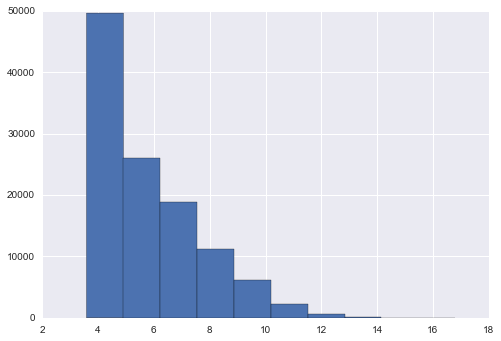

In [8]:
import math
plt.hist([math.log(i, 2) for i in x])

In [156]:
len([i for i in x if i <=100])

82882

(array([ 32558.,  17089.,   9020.,   1834.,   7362.,   4812.,   2228.,
          2775.,   3158.,   2046.]),
 array([  12. ,   20.8,   29.6,   38.4,   47.2,   56. ,   64.8,   73.6,
          82.4,   91.2,  100. ]),
 <a list of 10 Patch objects>)

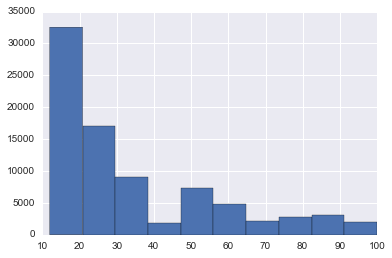

In [157]:
plt.hist([i for i in x if i <=100])

In [139]:
os.chdir("/Users/e.mazurov/workspace/Epigenetics")

In [12]:
mergedBins = {k: mergeBins(v) for c in corrs10 for k, v in c.iteritems()}
lncWithMergedBinsCount = {k: len(v) for k, v in mergedBins.iteritems() if len(v) != 0}
sortedlncWithMergedBinsCount = sorted(lncWithMergedBinsCount.items(), key=operator.itemgetter(1), reverse=True)

In [14]:
sum([x[1] for x in sortedlncWithMergedBinsCount])

245939

In [15]:
mergedBins

{'ENSG00000005206.12': [('chr17', (18254, 18254), 1, 0.72494432540264264),
  ('chr17', (77685, 77686), 2, 0.73557395007852888),
  ('chr17', (194876, 194876), 1, 0.74098978677485283),
  ('chr14', (113904, 113904), 1, 0.73482992983995143),
  ('chr19', (6174, 6174), 1, 0.72957823975059932),
  ('chr19', (25028, 25028), 1, 0.70675514570209264),
  ('chr19', (83690, 83691), 2, 0.74142033279815722),
  ('chr19', (102804, 102805), 2, 0.71320807761180705),
  ('chr1', (355788, 355788), 1, 0.7120805343134109)],
 'ENSG00000170161.6': [('chr12', (98095, 98095), 1, 0.72374087375294427),
  ('chr12', (147170, 147171), 2, 0.73363254856505744),
  ('chr12', (165278, 165278), 1, 0.75374417881003808),
  ('chr11', (46186, 46188), 3, 0.71384919894083121),
  ('chr11', (105787, 105787), 1, 0.77798417465530301),
  ('chr11', (159259, 159260), 2, 0.73363254856505744),
  ('chr10', (33724, 33724), 1, 0.73857838597111403),
  ('chr17', (17122, 17124), 3, 0.78571141410594292),
  ('chr17', (42764, 42766), 3, 0.7368773787

In [23]:
x = [(i[0], i[1][0], i[1][1]) for k, v in mergedBins.iteritems() for i in v]

In [ ]:
from collections import Counter
sorted(Counter(x).items(), key=operator.itemgetter(1), reverse=True)

In [51]:
len([i[2] for k, v in mergedBins.iteritems() for i in v if i[2] == 1])

74097

(array([ 74097.,      0.,  48308.,      0.,  38003.,      0.,  24963.,
             0.,  13308.,      0.,      0.,  10029.,      0.,   7592.,
             0.,   5549.,      0.,   4280.,      0.,   3531.]),
 array([  1.  ,   1.45,   1.9 ,   2.35,   2.8 ,   3.25,   3.7 ,   4.15,
          4.6 ,   5.05,   5.5 ,   5.95,   6.4 ,   6.85,   7.3 ,   7.75,
          8.2 ,   8.65,   9.1 ,   9.55,  10.  ]),
 <a list of 20 Patch objects>)

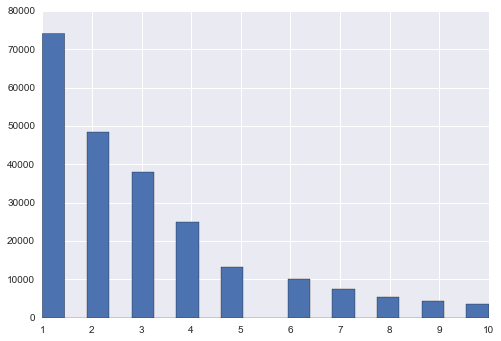

In [44]:
plt.hist([i[2] for k, v in mergedBins.iteritems() for i in v if i[2] <= 10], bins = 20)

In [11]:
def correct_pvalues_for_multiple_testing(pvalues, real_n):                
    """                                                                                                   
    consistent with R - print correct_pvalues_for_multiple_testing([0.0, 0.01, 0.029, 0.03, 0.031, 0.05, 0.069, 0.07, 0.071, 0.09, 0.1]) 
    """
    from numpy import array, empty                                                                        
    pvalues = array(pvalues) 
    n = float(pvalues.shape[0])                                                                           
    new_pvalues = empty(n)                                                         
    values = [(pvalue, i) for i, pvalue in enumerate(pvalues)]                                      
    values.sort()
    values.reverse()                                                                                  
    new_values = []
    for i, vals in enumerate(values):                                                                 
        rank = n - i
        pvalue, index = vals                                                                          
        new_values.append((real_n/rank) * pvalue)
        
    for i in xrange(0, int(n)-1):  
        if new_values[i] < new_values[i+1]:                                                           
            new_values[i+1] = new_values[i]
            
    for i, vals in enumerate(values):
        pvalue, index = vals
        new_pvalues[index] = new_values[i]
        
    return new_pvalues

In [113]:
load_all_variables(['filteredTFData', 'filteredTFGeneSet'])

Loaded the following variables: ['filteredTFData', 'filteredTFGeneSet']


In [114]:
filteredTFData.shape

(295, 17)

In [116]:
295*295

87025

In [27]:
load_all_variables(['TFcorrs', 'WGBinsCoords'])

Loaded the following variables: ['TFcorrs', 'WGBinsCoords']


In [9]:
flattenCorrs = [(k, pvalue) for c in TFcorrs for k, v in c.iteritems() for pvalue in v]

In [10]:
len(flattenCorrs)

72012

In [112]:
flattenCorrs[0]

('ENSG00000001167.10',
 ('chr12', 19309, 0.81928343501708856, 5.7300972421689162e-05))

In [12]:
correct_pv = correct_pvalues_for_multiple_testing([i[1][3] for i in flattenCorrs], 87025)

/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/ipykernel/__main__.py:8: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


In [13]:
len(correct_pv)

72012

In [14]:
flattenCorrsWithCorrectPv = [(c[0], (c[1][0], c[1][1], c[1][2], p)) for c, p in zip(flattenCorrs, correct_pv)]

In [15]:
flattenCorrsWithCorrectPv = [i for i in flattenCorrsWithCorrectPv if i[1][3] < 0.05]

In [16]:
flattenCorrsWithCorrectPv[10:20]

[('ENSG00000001167.10',
  ('chr17', 114509, 0.7807174777006769, 0.0011515056834404793)),
 ('ENSG00000001167.10',
  ('chr17', 114510, 0.74897715075117366, 0.0013952866390246844)),
 ('ENSG00000001167.10',
  ('chr17', 114511, 0.77480394905293837, 0.0011962174577925613)),
 ('ENSG00000001167.10',
  ('chr17', 114512, 0.7120805343134109, 0.0017933565340040615)),
 ('ENSG00000001167.10',
  ('chr17', 114513, 0.7120805343134109, 0.0017933565340040615)),
 ('ENSG00000001167.10',
  ('chr17', 114626, 0.73482992983995143, 0.0014076705972447721)),
 ('ENSG00000001167.10',
  ('chr17', 114627, 0.73482992983995143, 0.0014076705972447721)),
 ('ENSG00000001167.10',
  ('chr17', 114628, 0.73482992983995143, 0.0014076705972447721)),
 ('ENSG00000001167.10',
  ('chr17', 115217, 0.74142033279815722, 0.0014076705972447721)),
 ('ENSG00000001167.10',
  ('chr17', 115437, 0.72823952688174565, 0.0014076705972447721))]

In [17]:
g = ""
pairs = {}
for i in flattenCorrsWithCorrectPv:
    if(g != i[0]): g = i[0]
    l = pairs.get(g)
    if(l == None): pairs[g] = []
    pairs[g].append(i[1])

In [123]:
pairs

{'ENSG00000001167.10': [('chr12',
   19309,
   0.81928343501708856,
   0.0005211220738841571),
  ('chr12', 68798, 0.73153472836084854, 0.0014076705972447721),
  ('chr11', 103825, 0.77193430479718672, 0.0012764636903553784),
  ('chr11', 104831, 0.75011902439425548, 0.0013952866390246844),
  ('chr11', 104832, 0.7683774996330609, 0.001370106144804726),
  ('chr11', 105786, 0.72075888497824581, 0.0015485994276214466),
  ('chr17', 4780, 0.71938601091162058, 0.0015851713874976529),
  ('chr17', 57101, 0.77142057883952841, 0.0012918656930397457),
  ('chr17', 77685, 0.71432993707987102, 0.0017331825375338731),
  ('chr17', 77686, 0.70560582500021196, 0.0019329659037602399),
  ('chr17', 114509, 0.7807174777006769, 0.0011515056834404793),
  ('chr17', 114510, 0.74897715075117366, 0.0013952866390246844),
  ('chr17', 114511, 0.77480394905293837, 0.0011962174577925613),
  ('chr17', 114512, 0.7120805343134109, 0.0017933565340040615),
  ('chr17', 114513, 0.7120805343134109, 0.0017933565340040615),
  ('ch

In [20]:
mergedBins = {k: mergeBins(v) for k, v in pairs.iteritems()}
lncWithMergedBinsCount = {k: len(v) for k, v in mergedBins.iteritems() if len(v) != 0}
sortedlncWithMergedBinsCount = sorted(lncWithMergedBinsCount.items(), key=operator.itemgetter(1), reverse=True)

In [22]:
sum([i[1] for i in sortedlncWithMergedBinsCount])

31998

In [28]:
#return [(e[0], WGBinsCoords.get(e[0])[e[1][0]][0], WGBinsCoords.get(e[0])[e[1][1]][1], e[3]) for e in l]
coords = {k: getCoordsByNumber(v) for k, v in mergedBins.iteritems() if len(v) != 0}

In [29]:
coords

{'ENSG00000001167.10': [('chr12', 9217800, 9218250, 0.81928343501708856),
  ('chr12', 46910250, 46910700, 0.73153472836084854),
  ('chr11', 67035450, 67035900, 0.77193430479718672),
  ('chr11', 67251150, 67251750, 0.7683774996330609),
  ('chr11', 67771950, 67772400, 0.72075888497824581),
  ('chr17', 1639050, 1639500, 0.71938601091162058),
  ('chr17', 29820300, 29820750, 0.77142057883952841),
  ('chr17', 39684000, 39684600, 0.71432993707987102),
  ('chr17', 55484850, 55485900, 0.7807174777006769),
  ('chr17', 55502550, 55503300, 0.73482992983995143),
  ('chr17', 55603050, 55603500, 0.74142033279815722),
  ('chr17', 55638300, 55638750, 0.72823952688174565),
  ('chr17', 56412750, 56413350, 0.74707594518778786),
  ('chr17', 56459250, 56459850, 0.7188458860657817),
  ('chr17', 56459700, 56460150, 0.74754232862329784),
  ('chr17', 56460300, 56460750, 0.71892746252796291),
  ('chr17', 56462100, 56462550, 0.72494432540264264),
  ('chr17', 56495100, 56495550, 0.73566439816353457),
  ('chr17', 5

In [30]:
for_csv = [[k, b[0], str(b[1]) + '-' + str(b[2]), b[3]] for k, v in coords.iteritems() for b in v]

In [31]:
import csv
csv.register_dialect(
    'mydialect',
    delimiter = ';',
    quotechar = '"',
    doublequote = True,
    skipinitialspace = True,
    lineterminator = '\r\n',
    quoting = csv.QUOTE_MINIMAL)

header = ["gene", "chr", "bin coords", "corr"]

with open('TF_bins_corrs.csv', 'w') as mycsvfile:
    thedatawriter = csv.writer(mycsvfile, dialect='mydialect')
    thedatawriter.writerow(header)
    for row in for_csv:
        thedatawriter.writerow(row)

In [161]:
x = [(i[0], i[1][0], i[1][1]) for k, v in mergedBins.iteritems() for i in v]
from collections import Counter
sorted(Counter(x).items(), key=operator.itemgetter(1), reverse=True)

[(('chr17', 55305, 55305), 10),
 (('chr1', 293665, 293666), 10),
 (('chr21', 33956, 33959), 10),
 (('chr14', 83749, 83749), 10),
 (('chr2', 298867, 298870), 10),
 (('chr2', 219338, 219341), 10),
 (('chr12', 23342, 23344), 10),
 (('chr17', 113161, 113161), 10),
 (('chr10', 222562, 222562), 10),
 (('chr11', 14787, 14795), 10),
 (('chr12', 30147, 30148), 10),
 (('chr2', 44073, 44075), 10),
 (('chr11', 153179, 153182), 10),
 (('chr8', 227392, 227392), 10),
 (('chr17', 71928, 71931), 10),
 (('chr21', 55780, 55783), 10),
 (('chr19', 38268, 38268), 10),
 (('chr9', 191588, 191599), 10),
 (('chr14', 143639, 143640), 10),
 (('chr1', 70273, 70274), 10),
 (('chr5', 86623, 86623), 10),
 (('chr19', 60200, 60203), 10),
 (('chr21', 55877, 55877), 10),
 (('chr1', 335778, 335778), 10),
 (('chr6', 94780, 94782), 10),
 (('chr2', 37427, 37436), 10),
 (('chr2', 133981, 133983), 10),
 (('chr18', 90480, 90480), 10),
 (('chr17', 48228, 48228), 10),
 (('chr9', 47182, 47182), 10),
 (('chr14', 4775, 4783), 10),
 

(array([  1.09982000e+05,   6.01100000e+03,   8.44000000e+02,
          1.44000000e+02,   4.20000000e+01,   1.00000000e+01,
          6.00000000e+00]),
 array([  1.,  10.,  19.,  28.,  37.,  46.,  55.,  64.]),
 <a list of 7 Patch objects>)

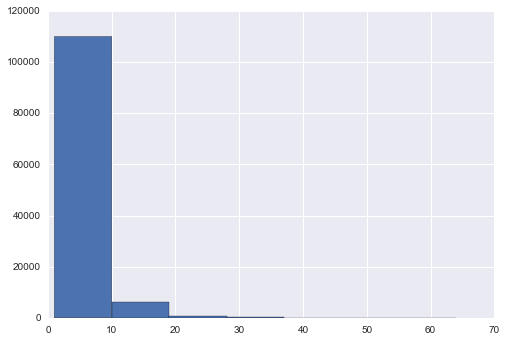

In [171]:
plt.hist([i[2] for k, v in mergedBins.iteritems() for i in v if i[2]], bins=7)

In [ ]:
#Прикидываем распределение:
#-генерим 100 РНК - определенной длины(4178) и GC=50%
#-генерим 100 бинов - определенной длины(450) и GC=50%
#-берем дефолтный параметр триплексатора
#получаем 10000 тысяч скоров
#строим распределение


In [3]:
#посчитать длины lncRNA
l = []
for seq_record in SeqIO.parse('./bins_coords/lncRNA.fa', "fasta"):
    l.append((seq_record.id, len(seq_record)))
l.sort(key=lambda tup: tup[1], reverse=True)

In [264]:
np.max([i[1] for i in l])

245651

In [265]:
np.min([i[1] for i in l])

267

(array([ 45.,  14.,   2.,   5.,   2.,   2.,   3.,   1.,   2.,   1.]),
 array([   267. ,   4572.4,   8877.8,  13183.2,  17488.6,  21794. ,
         26099.4,  30404.8,  34710.2,  39015.6,  43321. ]),
 <a list of 10 Patch objects>)

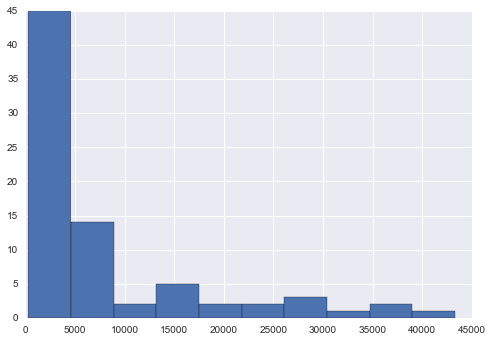

In [15]:
plt.hist([i[1] for i in l if i[1] < 50000])

In [73]:
def generateSequenceSet(count, a, t, g, c, length):
    sequenceset = []
    for i in range(0, count):
        sequenceset.append(''.join(np.random.choice(['A', 'T', 'G', 'C'], p=[a, t, g, c]) for i in range(length)))
    return sequenceset

In [74]:
def generateFasta(fileName, count, a, t, g, c, length):
    handle = open("./score_to_p-value/" + fileName, "a")
    i = 0
    for records in generateSequenceSet(count, a, t, g, c, length):
        SeqIO.write(SeqRecord(Seq(records, "rand_" + str(i)), id = "rand_" + str(i)), handle, "fasta")
        i = i + 1

In [75]:
def generateScoreDistribution(lncRNALength, binLength, lncRNAGC, binGC, count, triplexatorParam):
    lncRNAFileName = "generated_lncRNAs_" + str(lncRNALength) + "_" + str(binLength) + "_" + str(lncRNAGC) + "_" + str(binGC) + "_" + str(triplexatorParam) + ".fa"
    binFileName = "generated_bins_" + str(lncRNALength) + "_" + str(binLength) + "_" + str(lncRNAGC) + "_" + str(binGC) + "_" + str(triplexatorParam) + ".fa"
    outName = 'result_' + str(lncRNALength) + "_" + str(binLength) + "_" + str(lncRNAGC) + "_" + str(binGC) + "_" + str(triplexatorParam) + ".tpx"
    
    lncA=lncT=(100-lncRNAGC)/float(100)/2
    lncG=lncC=lncRNAGC/float(100)/2
    generateFasta(lncRNAFileName, count, lncA, lncT, lncG, lncC, lncRNALength)
    
    binA=binT=(100-binGC)/float(100)/2
    binG=binC=binGC/float(100)/2
    generateFasta(binFileName, count, binA, binT, binG, binC, binLength)
    
    os.chdir('./score_to_p-value')
    cmd = './triplexator -l 15 -E 3 -e 20 -c 2 -fr off -g 20 -fm 0 -of 1 -o ' + outName + ' -po -rm 2 -p 8 -ss ' + lncRNAFileName + ' -ds ' + binFileName
    print(cmd)
    p = subprocess.Popen(cmd, shell=True, stdout=subprocess.PIPE)
    p.wait()
    print p.returncode
    
    data = pd.read_csv(outName, sep='\t')
    data = data[data['# Sequence-ID'].str.startswith('rand')]
    dataGroup = data.groupby(['# Sequence-ID', 'Duplex-ID'])[["Score"]].sum()
    
    scores = dataGroup['Score']
    counts = data.groupby(['# Sequence-ID', 'Duplex-ID'])[["Score"]].size().tolist()
    
    print str(len(scores)) + " triplexes, Existing sums of triplexes = " + str(set(counts))
    
    return (data['Score'], scores, counts)

In [109]:
import warnings
import scipy.stats as st
import statsmodels as sm

In [243]:
matplotlib.rcParams['figure.figsize'] = (16.0, 12.0)
matplotlib.style.use('ggplot')

In [ ]:
from random import randint
#сделаем 9 итераций с одинаковыми параметрами и посмотрим какие там распределения
s = []
for i in range(0, 9):
    os.chdir('/Users/e.mazurov/workspace/Epigenetics')
    shutil.rmtree("./score_to_p-value")
    os.mkdir("./score_to_p-value")
    shutil.copyfile("triplexator", "./score_to_p-value/triplexator")
    os.chmod("./score_to_p-value/triplexator", 0o777)
    lncLen = randint(267,245651)
    binLen = randint(450,9990)
    lncGC = randint(20,80)
    binGC = randint(20,80)
    scores = generateScoreDistribution(lncLen, binLen, lncGC, binGC, 100, 15)
    s.append((getBestDistribution(scores), lncLen, binLen, lncGC, binGC))
    print 'finish ' + str(i)

In [ ]:
def generateScoreDistributionWithoutGrouping(lncRNALength, binLength, lncRNAGC, binGC, count, triplexatorParam):
    lncRNAFileName = "generated_lncRNAs_" + str(lncRNALength) + "_" + str(binLength) + "_" + str(lncRNAGC) + "_" + str(binGC) + "_" + str(triplexatorParam) + ".fa"
    binFileName = "generated_bins_" + str(lncRNALength) + "_" + str(binLength) + "_" + str(lncRNAGC) + "_" + str(binGC) + "_" + str(triplexatorParam) + ".fa"
    outName = 'result_' + str(lncRNALength) + "_" + str(binLength) + "_" + str(lncRNAGC) + "_" + str(binGC) + "_" + str(triplexatorParam) + ".tpx"
    
    lncA=lncT=(100-lncRNAGC)/float(100)/2
    lncG=lncC=lncRNAGC/float(100)/2
    generateFasta(lncRNAFileName, count, lncA, lncT, lncG, lncC, lncRNALength)
    
    binA=binT=(100-binGC)/float(100)/2
    binG=binC=binGC/float(100)/2
    generateFasta(binFileName, count, binA, binT, binG, binC, binLength)
    
    os.chdir('./score_to_p-value')
    cmd = './triplexator -l 15 -e 20 -c 2 -fr off -g 20 -fm 0 -of 1 -o ' + outName + ' -po -rm 2 -p 8 -ss ' + lncRNAFileName + ' -ds ' + binFileName
    print(cmd)
    p = subprocess.Popen(cmd, shell=True, stdout=subprocess.PIPE)
    p.wait()
    print p.returncode
    
    data = pd.read_csv(outName, sep='\t')
    data = data[data['# Sequence-ID'].str.startswith('rand')]
    
    print data.shape
    
    return data['Score']

In [3]:
data = pd.read_csv('score_to_p-value/result_2000_2000_50_50_15.tsv', sep='\t')
data = data[data['# Sequence-ID'].str.startswith('rand')]

In [59]:
float(3)/len(data.groupby(['# Sequence-ID', 'Duplex-ID'])[["Score"]].size().tolist())

0.003870967741935484

(array([ 682.,    0.,   80.,    0.,    9.,    0.,    3.,    0.,    0.,    1.]),
 array([ 1. ,  1.5,  2. ,  2.5,  3. ,  3.5,  4. ,  4.5,  5. ,  5.5,  6. ]),
 <a list of 10 Patch objects>)

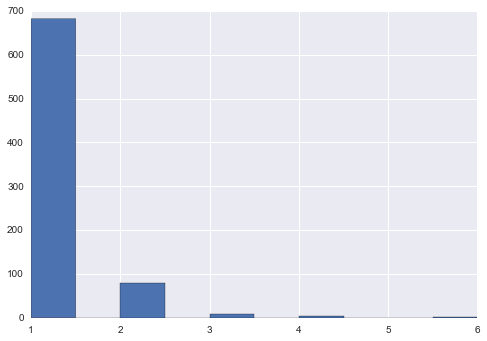

In [61]:
plt.hist(data.groupby(['# Sequence-ID', 'Duplex-ID'])[["Score"]].size().tolist())

In [58]:
logser.pmf([1,2,3,4,5,6], p)

array([  8.79996203e-01,   1.01199563e-01,   1.55172664e-02,
         2.67672845e-03,   4.92518035e-04,   9.43992900e-05])

In [81]:
import os
s = []
for i in range(0, 4):
    os.chdir('/Users/e.mazurov/workspace/Epigenetics')
    shutil.rmtree("./score_to_p-value")
    os.mkdir("./score_to_p-value")
    shutil.copyfile("triplexator", "./score_to_p-value/triplexator")
    os.chmod("./score_to_p-value/triplexator", 0o777)
    (scores_without_grouping, scores, counts) = generateScoreDistribution(400000, 450, 45, 45, 150, 15)
    s.append((scores, counts, scores_without_grouping))
    print 'finish ' + str(i)

./triplexator -l 15 -E 3 -e 20 -c 2 -fr off -g 20 -fm 0 -of 1 -o result_400000_450_45_45_15.tpx -po -rm 2 -p 8 -ss generated_lncRNAs_400000_450_45_45_15.fa -ds generated_bins_400000_450_45_45_15.fa
0
16274 triplexes, Existing sums of triplexes = set([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 62, 63, 64, 65, 66])
finish 0


KeyboardInterrupt: 

(array([  3.93600000e+03,   2.95800000e+03,   2.30700000e+03,
          1.66700000e+03,   1.13900000e+03,   4.07000000e+02,
          5.59000000e+02,   5.66000000e+02,   4.18000000e+02,
          3.38000000e+02,   1.82000000e+02,   1.55000000e+02,
          1.29000000e+02,   1.60000000e+02,   1.37000000e+02,
          1.14000000e+02,   8.20000000e+01,   7.10000000e+01,
          8.00000000e+01,   9.10000000e+01,   8.90000000e+01,
          4.50000000e+01,   4.60000000e+01,   3.80000000e+01,
          3.70000000e+01,   3.50000000e+01,   4.00000000e+01,
          2.40000000e+01,   1.70000000e+01,   2.00000000e+01,
          1.60000000e+01,   2.20000000e+01,   1.10000000e+01,
          1.00000000e+01,   2.10000000e+01,   7.00000000e+00,
          1.30000000e+01,   9.00000000e+00,   9.00000000e+00,
          6.00000000e+00,   1.10000000e+01,   1.20000000e+01,
          5.00000000e+00,   1.10000000e+01,   7.00000000e+00,
          1.10000000e+01,   1.60000000e+01,   1.10000000e+01,
        

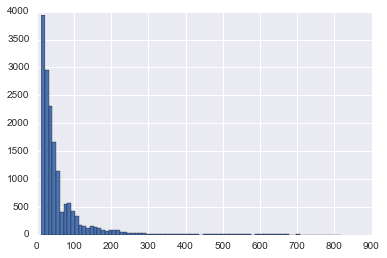

In [89]:
plt.hist(s[0][0], bins=80)

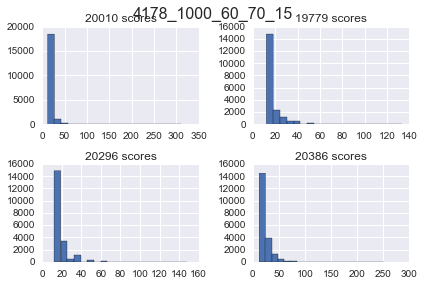

In [77]:
fig=plt.figure()
for i in range(0,4):
    ax = plt.subplot(2,2,i+1)
    ax.set_title(str(len(s[i][0])) + ' scores')
    ax.hist(s[i][0], bins=20)
    #ax.plot(range(13, 20), [j*len(s[i][0].tolist()) for j in pmf(range(13, 20), 13, 2, 0.84)], 'bo')
    
fig.suptitle('4178_1000_60_70_15', fontsize=16)
plt.tight_layout()
fig.subplots_adjust(top=0.91)

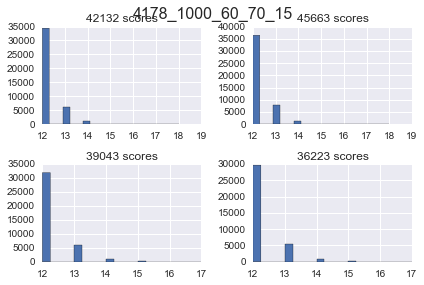

In [161]:
fig=plt.figure()
for i in range(0,4):
    ax = plt.subplot(2,2,i+1)
    ax.set_title(str(len(s[i][2])) + ' scores')
    ax.hist(s[i][2], bins=20)
    #ax.plot(range(13, 20), [j*len(s[i][0].tolist()) for j in pmf(range(13, 20), 13, 2, 0.84)], 'bo')
    
fig.suptitle('4178_1000_60_70_15', fontsize=16)
plt.tight_layout()
fig.subplots_adjust(top=0.91)

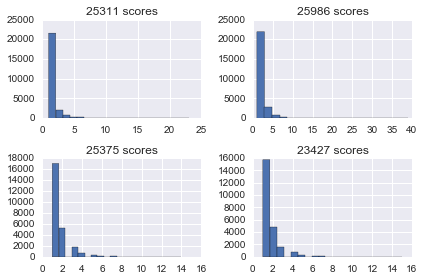

In [162]:
for i in range(0,4):
    ax = plt.subplot(2,2,i+1)
    ax.set_title(str(len(s[i][1])) + ' scores')
    ax.hist(s[i][1], bins=20)
    #ax.plot(range(13, 20), [j*len(s[i][0].tolist()) for j in pmf(range(13, 20), 13, 2, 0.84)], 'bo')
    
fig.suptitle('4178_1000_60_70_15', fontsize=16)
plt.tight_layout()
fig.subplots_adjust(top=0.91)

In [12]:
#Оценить параметр Logser
def logserMLE(sumObservations, lenObservations, x0):
    return 1 - newton(logserMLEFunction, x0, args=(sumObservations, lenObservations))

In [13]:
def logserMLEFunction(x, sumObservations, lenObservations):
    return -sumObservations/(1 - x) - lenObservations/(x*math.log(x))

In [14]:
#Оценить параметр NB, использовать не суммированные скоры
def nbMLE(sumObservations, lenObservations):
    return (lenObservations*3)/(lenObservations*3 + sumObservations)

In [177]:
NBP

0.19714806650883065

In [59]:
def g(r, p, m):
    return (1 - p)**(-r) - sum(binom(x + r - 1, x)*p**x for x in range(0, m + 1))

In [60]:
def TNBpmf2(k, r, p, m):
    return [binom(i + r - 1, i)*(p**i)/g(r, p, m) if i > m else 0 for i in k]

In [61]:
def pmfOfSumTNB(s, n, r, p, m, pmf1, pmf2):
    s = s - 1#т.к. рекуррентная формула
    return (p/float(s + 1))*((s + n*r)*pmf1 + n*(r + m)*binom(r + m - 1, m)*(p**m)*pmf2*g(r, p, m)**(-1))

In [62]:
# r - параметр NB
# m - параметр TNB
# n - максимальное количество триплексов в одной паре
# PNB - вероятность в NB
# PLogser - вероятность в Logser
# count - количество элементов в каждой pmf(можем вычислить на основе s и n?) - как понять какой он должен быть?
def getScoresPmf(r, m, n, PNB, PLogser, count):
    #получаем список pmf для mixture
    pmfs = []
    pmfs.append(TNBpmf2(range(0, m + 1 + count), r, PNB, m))#первый pmf, сумма из одного TNB
    
    for i in range(2, n + 1):#кол-во элементов в сумме
        tmpTNB = [0 for z in range(0, (m + 1)*i)]
        tmpTNB.append(pmfs[0][m + 1]**2) if i == 2 else tmpTNB.append(pmfs[0][m + 1]*pmfs[i - 2][(m + 1)*(i - 1)])
        k = 0
        for j in range((m + 1)*i + 1, (m + 1)*i + count):
            tmpTNB.append(pmfOfSumTNB(j, i, r, PNB, m, tmpTNB[k + (m + 1)*i], pmfs[i - 2][k + (m + 1)*(i - 1) + 1]))
            k = k + 1
        pmfs.append(tmpTNB)
 
    distr = []
    ls = logser.pmf(range(1, n + 1), PLogser)
    
    for x in range(m + 1, n*(m + 1) + count + 1):
        tnbs = [pmfs[tnb][x]*ls[tnb] if x < len(pmfs[tnb]) else 0 for tnb in range(0, n)]
        distr.append(sum(tnbs))
    
    return distr

In [72]:
t = getScoresPmf(3, 11, 3, 0.197148, 0.557969, 12)

In [1]:
sum(t)

NameError: name 't' is not defined

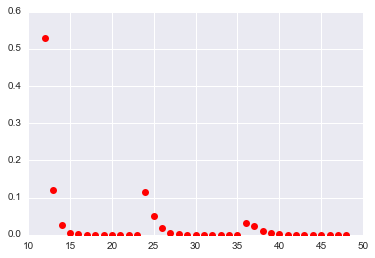

In [73]:
plt.plot(range(12, 12 + len(t)), t, "ro")

In [ ]:
#Просто Pr(S>=score|H), а гребни не будут мешать? Т.е. скор=20 по идее весьма маловероятен, но у него будет "плохое" p-value
def pvalueForScores(pmf, score):
    

In [6]:
#посмотреть распределения длин бинов, длин lncRNA, GC состава бинов, GC состава lncRNA
#все нужные файлы лежат в папке bins_coords

#длины и GC состав lncRNA
#посчитать длины lncRNA
os.chdir('/Users/e.mazurov/workspace/Epigenetics')
lnc = []
for seq_record in SeqIO.parse('./bins_coords/lncRNA.fa', "fasta"):
    lnc.append((seq_record.id, len(seq_record), GC(seq_record.seq)))
lnc.sort(key=lambda tup: tup[1], reverse=True)

(array([ 4.,  3.,  2.,  2.,  3.,  2.,  2.,  3.,  7.,  3.,  7.,  7.,  5.,
         3.,  3.,  4.,  0.,  1.,  2.,  2.,  4.,  7.,  3.,  2.,  2.,  1.,
         0.,  0.,  0.,  2.]),
 array([ 33.61276838,  34.68416986,  35.75557133,  36.8269728 ,
         37.89837427,  38.96977575,  40.04117722,  41.11257869,
         42.18398016,  43.25538164,  44.32678311,  45.39818458,
         46.46958606,  47.54098753,  48.612389  ,  49.68379047,
         50.75519195,  51.82659342,  52.89799489,  53.96939636,
         55.04079784,  56.11219931,  57.18360078,  58.25500225,
         59.32640373,  60.3978052 ,  61.46920667,  62.54060815,
         63.61200962,  64.68341109,  65.75481256]),
 <a list of 30 Patch objects>)

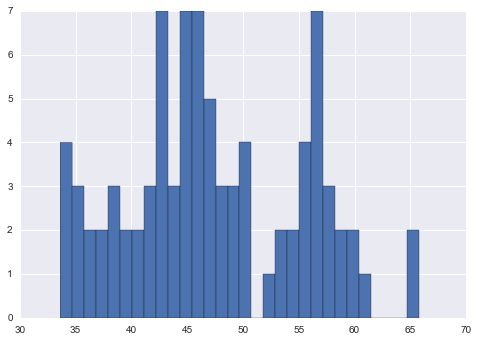

In [13]:
plt.hist([i[2] for i in lnc], bins=30)

(array([ 56.,   9.,   4.,   5.,   2.,   1.,   0.,   1.,   0.,   1.,   0.,
          0.,   1.,   0.,   0.,   2.,   2.,   0.,   0.,   0.,   0.,   0.,
          0.,   1.,   0.,   0.,   0.,   0.,   0.,   1.]),
 array([    267.        ,    8446.46666667,   16625.93333333,
          24805.4       ,   32984.86666667,   41164.33333333,
          49343.8       ,   57523.26666667,   65702.73333333,
          73882.2       ,   82061.66666667,   90241.13333333,
          98420.6       ,  106600.06666667,  114779.53333333,
         122959.        ,  131138.46666667,  139317.93333333,
         147497.4       ,  155676.86666667,  163856.33333333,
         172035.8       ,  180215.26666667,  188394.73333333,
         196574.2       ,  204753.66666667,  212933.13333333,
         221112.6       ,  229292.06666667,  237471.53333333,  245651.        ]),
 <a list of 30 Patch objects>)

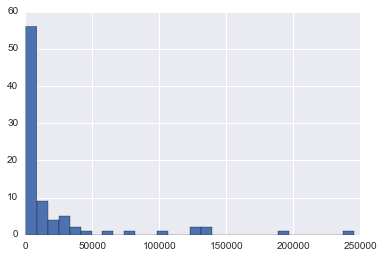

In [62]:
plt.hist([i[1] for i in lnc], bins=30)

In [7]:
import fnmatch
os.chdir('/Users/e.mazurov/workspace/Epigenetics')
l = []
for f in [f for f in os.listdir('./bins_coords/') if fnmatch.fnmatch(f, 'seqs_for_lnc_*.fa')]:
    for seq_record in SeqIO.parse('./bins_coords/' + f, "fasta"):
        l.append((seq_record.id, len(seq_record), GC(seq_record.seq)))
l.sort(key=lambda tup: tup[1], reverse=True)

(array([    16.,     77.,    239.,    828.,   2254.,   4271.,   6712.,
          9332.,  12348.,  13329.,  12805.,  12882.,  11325.,   8510.,
          6565.,   4783.,   3364.,   2502.,   1679.,   1144.,    664.,
           376.,    218.,    183.,    222.,    205.,    101.,     64.,
            20.,     21.]),
 array([ 22.66666667,  24.82777778,  26.98888889,  29.15      ,
         31.31111111,  33.47222222,  35.63333333,  37.79444444,
         39.95555556,  42.11666667,  44.27777778,  46.43888889,
         48.6       ,  50.76111111,  52.92222222,  55.08333333,
         57.24444444,  59.40555556,  61.56666667,  63.72777778,
         65.88888889,  68.05      ,  70.21111111,  72.37222222,
         74.53333333,  76.69444444,  78.85555556,  81.01666667,
         83.17777778,  85.33888889,  87.5       ]),
 <a list of 30 Patch objects>)

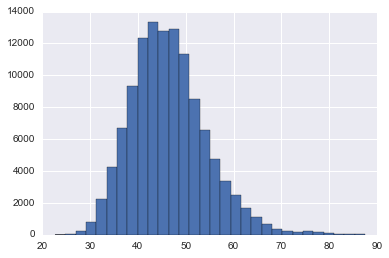

In [100]:
plt.hist([i[2] for i in l], bins=30)

(array([  8.06230000e+04,   1.72550000e+04,   7.90900000e+03,
          4.19500000e+03,   2.38800000e+03,   1.60000000e+03,
          1.07300000e+03,   7.40000000e+02,   3.88000000e+02,
          2.48000000e+02,   2.84000000e+02,   9.40000000e+01,
          4.60000000e+01,   3.40000000e+01,   3.60000000e+01,
          4.80000000e+01,   2.00000000e+01,   0.00000000e+00,
          1.00000000e+01,   3.20000000e+01,   0.00000000e+00,
          1.00000000e+01,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   0.00000000e+00,
          0.00000000e+00,   0.00000000e+00,   6.00000000e+00]),
 array([  450.,   765.,  1080.,  1395.,  1710.,  2025.,  2340.,  2655.,
         2970.,  3285.,  3600.,  3915.,  4230.,  4545.,  4860.,  5175.,
         5490.,  5805.,  6120.,  6435.,  6750.,  7065.,  7380.,  7695.,
         8010.,  8325.,  8640.,  8955.,  9270.,  9585.,  9900.]),
 <a list of 30 Patch objects>)

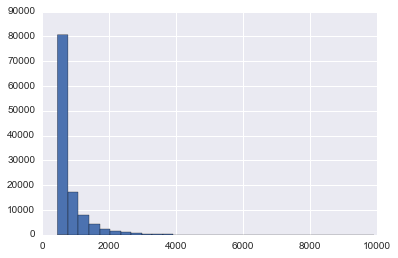

In [52]:
plt.hist([i[1] for i in l], bins=30)

In [ ]:
#Нужно понять для каких параметров генерить распределения, а точнее получить другие параметры, для каждого из которых можно будет
#построить регрессию. Или возможно можно обойтись без регрессии и для каждого сочетания параметров посчитать распределение?

#В любом случае построим табличку lenRNA\lenBin\GCRNA\GCBin\\PNB\PLOGSER, посмотреть на данные, подумать о регрессии

#Задача: понять какие параметры брать, чтобы покрыть все наши пары, чтобы это было подъемно по вычислениям
#Хотим получить более общую модель, чем нам нужна для нашей задачи - впринципе получение p-value скоров триплексатора для любых
#последовательостей(с любыми параметрами), т.е. будем перебирать максимум четверок параметров(когда для нашего случая этого не надо)

#можем позволить себе считать 12 часов, предположим одно распрделение считается 2 минуты(с учетом супер длинных), тогда мы сможем
#посчитать 360 точек, это по 90 з

In [8]:
trainingSet = {'lncLengths' : [], 'lncGCs' : [], 'binsLengths' : [], 'binsGCs' : []}

lncLengths = [i[1] for i in lnc]
lncGCs = [i[2] for i in lnc]

binsLengths = [j[1] for j in l]
binsGCs = [j[2] for j in l]

for i in [25, 50, 75, 95]:
    trainingSet['lncLengths'].append(int(round(np.percentile(lncLengths, i))))
    trainingSet['lncGCs'].append(int(round(np.percentile(lncGCs, i))))
    trainingSet['binsLengths'].append(int(round(np.percentile(binsLengths, i))))
    trainingSet['binsGCs'].append(int(round(np.percentile(binsGCs, i))))

In [9]:
trainingSet

{'binsGCs': [41, 46, 51, 61],
 'binsLengths': [450, 600, 900, 1800],
 'lncGCs': [42, 46, 54, 59],
 'lncLengths': [1324, 4179, 16008, 126531]}

In [10]:
import itertools

permutations = []
for i in itertools.product('0123', repeat=4):
    permutations.append((trainingSet['lncLengths'][int(i[0])], trainingSet['lncGCs'][int(i[1])], trainingSet['binsLengths'][int(i[2])], trainingSet['binsGCs'][int(i[3])]))

In [130]:
#один раз сгенерить все данные, не надо для каждой четверки заново генерить
s = []
for i in permutations:
    os.chdir('/Users/e.mazurov/workspace/Epigenetics')
    shutil.rmtree("./score_to_p-value")
    os.mkdir("./score_to_p-value")
    shutil.copyfile("triplexator", "./score_to_p-value/triplexator")
    os.chmod("./score_to_p-value/triplexator", 0o777)
    (scores_without_grouping, scores, counts) = generateScoreDistribution(i[0], i[2], i[1], i[3], 150, 15)
    s.append((scores, counts, scores_without_grouping))
    print 'finish ' + str(i)

./triplexator -l 15 -E 3 -e 20 -c 2 -fr off -g 20 -fm 0 -of 1 -o result_1324_450_42_41_15.tpx -po -rm 2 -p 8 -ss generated_lncRNAs_1324_450_42_41_15.fa -ds generated_bins_1324_450_42_41_15.fa
0
264 triplexes, Existing sums of triplexes = set([1, 2, 3])
finish (1324, 42, 450, 41)
./triplexator -l 15 -E 3 -e 20 -c 2 -fr off -g 20 -fm 0 -of 1 -o result_1324_450_42_46_15.tpx -po -rm 2 -p 8 -ss generated_lncRNAs_1324_450_42_46_15.fa -ds generated_bins_1324_450_42_46_15.fa
0
239 triplexes, Existing sums of triplexes = set([1, 2])
finish (1324, 42, 450, 46)
./triplexator -l 15 -E 3 -e 20 -c 2 -fr off -g 20 -fm 0 -of 1 -o result_1324_450_42_51_15.tpx -po -rm 2 -p 8 -ss generated_lncRNAs_1324_450_42_51_15.fa -ds generated_bins_1324_450_42_51_15.fa
0
188 triplexes, Existing sums of triplexes = set([1, 2, 3])
finish (1324, 42, 450, 51)
./triplexator -l 15 -E 3 -e 20 -c 2 -fr off -g 20 -fm 0 -of 1 -o result_1324_450_42_61_15.tpx -po -rm 2 -p 8 -ss generated_lncRNAs_1324_450_42_61_15.fa -ds generat

In [2]:
os.chdir('/Users/e.mazurov/workspace/Epigenetics/score_to_p-value')
load_all_variables(['distributions'])

Loaded the following variables: ['distributions']


In [3]:
len(distributions[11][1])

361

In [15]:
regressionData = []
j = 0;
for i in distributions:
    params = permutations[j]
    try:
        regressionData.append(params + (nbMLE(sum(i[2]), len(i[2])), logserMLE(sum(i[1]), len(i[1]), 0.01)))
    except ValueError as e:
        print "error MLE in " + str(j)
    j = j + 1

In [124]:
regressionData

[(1324, 42, 450, 41, 0.19655172413793104, 0.1403036225466655),
 (1324, 42, 450, 46, 0.19753086419753085, 0.12706065028016744),
 (1324, 42, 450, 51, 0.19685039370078741, 0.11529447909512192),
 (1324, 42, 450, 61, 0.19781718963165076, 0.10635972104636393),
 (1324, 42, 600, 41, 0.19771291002106531, 0.20373322963015517),
 (1324, 42, 600, 46, 0.19693978282329713, 0.16547209952407194),
 (1324, 42, 600, 51, 0.19726027397260273, 0.16384824737279458),
 (1324, 42, 600, 61, 0.1980464802963961, 0.1454471788943038),
 (1324, 42, 900, 41, 0.19719573752103198, 0.17030162630309698),
 (1324, 42, 900, 46, 0.19709866922431363, 0.135739807226821),
 (1324, 42, 900, 51, 0.19757272889523469, 0.12456110553484223),
 (1324, 42, 900, 61, 0.19765436357364607, 0.10599091538884975),
 (1324, 42, 1800, 41, 0.19747942922612227, 0.22599673069310544),
 (1324, 42, 1800, 46, 0.19699710564399422, 0.18083033694625694),
 (1324, 42, 1800, 51, 0.19706117698406925, 0.17290377882966024),
 (1324, 42, 1800, 61, 0.19746314706890641,

In [16]:
d = {'RNALength' : pd.Series([i[0] for i in regressionData], index=range(0, 256)),
   'RNA_GC' : pd.Series([i[1] for i in regressionData], index=range(0, 256)),
     'BinsLength' : pd.Series([i[2] for i in regressionData], index=range(0, 256)),
     'Bins_GC' : pd.Series([i[3] for i in regressionData], index=range(0, 256)),
     'PLogser' : pd.Series([i[5] for i in regressionData], index=range(0, 256))
    }

In [17]:
df = pd.DataFrame(d)

In [18]:
df = df[['RNALength', 'RNA_GC', 'BinsLength', 'Bins_GC', 'PLogser']]

In [19]:
df.head()

,RNALength,RNA_GC,BinsLength,Bins_GC,PLogser
0,1324,42,450,41,0.140304
1,1324,42,450,46,0.127061
2,1324,42,450,51,0.115294
3,1324,42,450,61,0.106360
4,1324,42,600,41,0.203733


In [146]:
titles = {0:'RNALength', 1:'RNA_GC', 2:'BinLength', 3:'BinGC'}

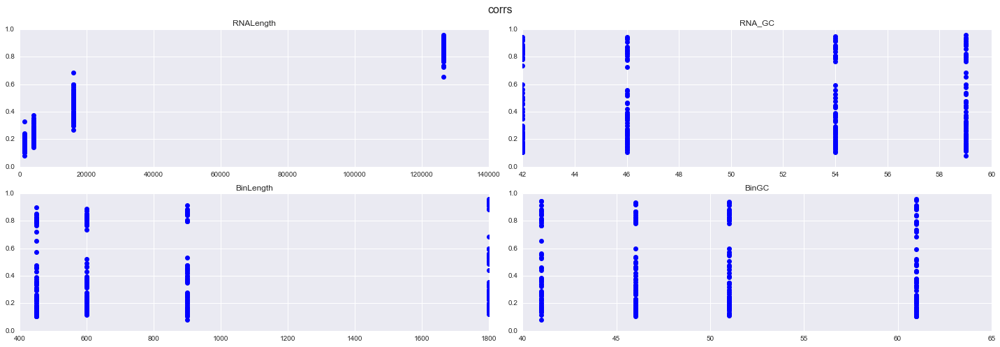

In [147]:
fig=plt.figure()
plt.rcParams["figure.figsize"] = (20,7)
for i in range(0,4):
    ax = plt.subplot(2,2,i+1)
    ax.set_title(titles[i])
    ax.plot([j[i] for j in regressionData], [k[5] for k in regressionData], 'bo')
    
fig.suptitle('corrs', fontsize=16)
plt.tight_layout()
fig.subplots_adjust(top=0.91)

In [148]:
import csv
test = []
csv.register_dialect(
    'mydialect',
    delimiter = ';',
    quotechar = '"',
    doublequote = True,
    skipinitialspace = True,
    lineterminator = '\r\n',
    quoting = csv.QUOTE_MINIMAL)

header = ["RNALength", "RNA_GC", "BinLength", "BinGC", "PNB", "PLogser"]
             
with open('regressionData.csv', 'w') as mycsvfile:
    thedatawriter = csv.writer(mycsvfile, dialect='mydialect')
    thedatawriter.writerow(header)
    for row in regressionData:
        thedatawriter.writerow(row)

In [22]:
X = df[['RNALength', 'RNA_GC', 'BinsLength', 'Bins_GC']]
y = df['PLogser']

In [23]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import make_scorer
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
model = LinearRegression()
model.fit(X, y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [24]:
kfold = KFold(n_splits=4, shuffle=True, random_state=12345)

scores = cross_val_score(LinearRegression(), X, y, groups=None, scoring=make_scorer(r2_score), cv=kfold)

In [ ]:
#Надо составить таблицу параметров наших данных для предсказания параметра PLogser, а потом посчитать p-value

In [483]:
0)Какие-нибудь тонкости работы с цепями в fasta, о которых я не подумал? - 
1)Найти бины, коррелирующие с максимально большим количеством нкРНК
2)Сделать одну таблицу: lncRNA|Bin|Score|Corr + 
3)Гистограмма скоров + 

Сделать поправку(с учетом количества корреляций)

Найти зависимость скора(не суммы!) от GC состава и длины lncRNA(бины обратно разобрать до одинаковой длины)
Что делают с результатами другие?
Перейти от скора к p-value

Берем конктретную пару длина - GC состав, генерим кучу последовательностей, получаем распределение скоров(среднее, сигма), берем много
таких пар - много распределений(много пар), потом фитим. Потом берем нашу конкретную пару - по ней получаем среднее и дисперсию

117039 бинов, сколько из них уникальных? - 19880
Какой бин популярнее всего? - ('chr17', 55305, 55305) - коррелирует с 10ю lncRNA, но таких много
Распределение длин смердженых бинов? - 229660 меньше 10, 74097 с 1, 
55082 возможных мест связывания

Почему не получается распределение:
1)Генерим последовательности с буквами с одинаковой вероятностью, это нормально?
2)У одной длины нкРНК получается примерно одинаковое количество TFO(но надо это проверить лучше)
3)Нужно ли "смешивать" параметры? т.е.
4)Нужно учитывать в распределении то, что у большей части последовательностей скор = 0
5)Допустим получим p-value, найдя подходящие параметры(распределение), а как-нибудь будем сравнивать сами параметры?(длина, gc и проч) вмысле кто
вероятнее связывается: с такими параметрами или с другими?
    
l не может быть меньше 10, если подряд 2 ошибки - триплексатор обрывается -> может не дотянуть до параметра r(он же -E)

План:
1)Делаем truncate NB - получаем предполагаемое распределение(не пользуемся обычным NB, потому что будут мешать нули? или не будут?)
2)Есть параметр r, но нет вероятности p - можем ее оценить через наши данные(скоры) - Maximum likelihood estimation
3)В итоге получаем распределение соответсвтующее нашим данным
4)Как проверить что наши данные соответствуют этому распределению?

Наше итоговое распределение скоров это сумма случайного количества случайных величин
Как распределено количество триплексов?

SyntaxError: invalid syntax (<ipython-input-483-eba31d272ce7>, line 1)

In [ ]:
1)Разобраться с параметрами триплексатора E и e (так чтобы был осмысленный параметр r и было нормальное количество триплексов)
- если правильно подобрать параметры l, e, E, то можно добиться того что триплекс будет удлиняться ровно до E ошибок, мы возьмем 
  -l 15 -e 20 -E 3
2)Какие еще есть лимитирующие факторы у триплексатора, не вписывающиеся в NB?
- есть почему то ограничение по максимальной длине триплекса, но пофакту мы ее видимо никогда не достигаем

3)Как и какие мы генерим пары для симуляции? генерим одинаковое количество нкРНК и бинов, потом по идее триплексатор должен для каждой
нкРНК попробовать все бины, но скорее всего он сначала их фильтрует(проверяет есть ли там TTS и TFO)

4)Оценить NB
Т.к. параметр r известен, нам нужно только оценить p, для него есть явная формула. Данные для оценки - не суммированные скоры триплексов

5)Проверить оценку NB
Goodness of fit Chi-squared test?
https://link.springer.com/article/10.1007/s00362-016-0820-5

6)Truncate NB
pmf/(1 - cdf(m))

7)Оценить Logser
Нет явной формулы, нужно численное решение, судя по всему подходит Ньютон, но есть статья, где описаны ограничения, надо их проверить

8)Проверить оценку Logser
https://www.hindawi.com/journals/ads/2008/463781/

9)Вывести распределение, описывающее наши данные
Судя по всему наша случайная величина, которая описывает длину триплексов для пары(с учетом того что для одной пары может быть несколько
триплексов и мы складываем их скоры) это случайная сумма случайных величин, где суммируемые величины распределены по TNB, а количество
суммируемых величин распределено по Logser. 
https://proofwiki.org/wiki/PGF_of_Sum_of_Random_Number_of_Discrete_Random_Variables

10)Проверить это распределение
http://www.astro.gla.ac.uk/~martin/teaching/ada1/temp/sa1_sec3_5_3_6.pdf

In [ ]:
Что надо сделать на данный момент(6 июня 2017)
1)Учитывать в первых элементах сумм распределений все слагаемые(а не самое большое как сейчас), еще раз подумать нужно ли это
2)Изучить какие бывают длины последовательностей и GC составы в наших парах
3)Прикинуть какая нужна сетка для моделирования распределений и регрессии
4)Посчитать регрессию
5)Отфильтровать скоры наших пар(еще раз обдумать правильно ли мы используем p-value)
6)Использовать вместо скоров potential(еще раз четко изучить и понять что это такое и разумно ли это использовать)
7)симулированные последовательности vs последовательности из генома
+8)Как оценить точность нашего фита? - судя по всему никак, но у нас очень сильные изначальные предположения о природе данных